In [1]:
import numpy as np
from matplotlib import pyplot as plt
import pickle
import os
import pandas as pd

# FCN on MNIST
## find optimal sigma according to testing accuracy on sigmatest=0.2

In [2]:
width = 3
depth = 3
lr = 0.001
iter = 10000
df = []
for alphatrain in [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture']:
    for sigmatrain in [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
        if alphatrain == 0:
            sigmatrain = 0.1
        for alphatest in [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture']:
            sigmatest = 0.2
            acc_path = f"../results20231202/acc_FCN_width{width}_depth{depth}_b64_alphatrain{alphatrain}_sigmatrain{sigmatrain}_lr{lr}_iter{iter}_alphatest{alphatest}_sigmatest{sigmatest}.txt"
            if os.path.exists(acc_path) == 0:
                print('no exists,', acc_path)
                continue
            f = open(acc_path, 'rb')
            acc = pickle.load(f)
            df.append([alphatrain, sigmatrain, alphatest, sigmatest, np.mean(acc), np.std(acc)])
        if alphatrain == 0:
            break

no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest0_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest2_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest1.9_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest1.5_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest1.3_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest1_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b64_alphatrainmixture_sigmatrain0.3_lr0.001_iter10000_alphatest0.9_sigmatest0.2.txt
no exists, ../results20231202/acc_FCN_width3_depth3_b6

In [3]:
df = pd.DataFrame(df, columns=['alphatrain', 'sigmatrain', 'alphatest', 'sigmatest', 'mean', 'std'])

In [4]:
df['alphatrain'].unique()

array([0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture'], dtype=object)

In [5]:
dict_opt_sigma = {}
dict_opt_sigma[0]=0.1
for alphatrain in [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture']:
# for alphatrain in [2]:
    tmp = df[(df['alphatrain']==alphatrain) & (df['alphatest'].isin([0,2,1.9,1.5,1.3,1,0.9,'multiple','mixture']))]
    if len(tmp) < 45:
        print(alphatrain, '结果不完整', len(tmp))
        continue
    opt_sigma = tmp.groupby('sigmatrain')['mean'].mean().idxmax().copy()
    dict_opt_sigma[alphatrain] = opt_sigma
    print(alphatrain, opt_sigma)

0 结果不完整 9
2 0.35
1.9 0.35
1.5 0.3
1.3 0.3
1 0.2
0.9 0.15
multiple 0.25
mixture 0.25


In [2]:
dict_opt_sigma={0.0: 0.1,
 2.0: 0.35,
 'multiple': 0.25,
 'mixture': 0.25,
 1.9: 0.35,
 1.5: 0.3,
 1.3: 0.3,
 1.0: 0.2,
 0.9: 0.15}

## 确定最优sigmatrain后，读取在不同sigmatest上的结果，画图

In [11]:
width = 10
depth = 3
lr = 0.001
iter = 10000
df = []
for alphatrain in [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture']:
    sigmatrain = dict_opt_sigma[alphatrain]
    for alphatest in [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture']:
        for sigmatest in [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
            acc_path = f"../results20231202/acc_FCN_width{width}_depth{depth}_b64_alphatrain{alphatrain}_sigmatrain{sigmatrain}_lr{lr}_iter{iter}_alphatest{alphatest}_sigmatest{sigmatest}.txt"
            if os.path.exists(acc_path) == 0:
                print('no exists,', acc_path)
                continue
            f = open(acc_path, 'rb')
            acc = pickle.load(f)
            df.append([alphatrain, sigmatrain, alphatest, sigmatest, np.mean(acc), np.std(acc)])
            if alphatest == 0:
                break

In [12]:
df = pd.DataFrame(df, columns=['alphatrain', 'sigmatrain', 'alphatest', 'sigmatest', 'mean', 'std'])

In [13]:
df

,alphatrain,sigmatrain,alphatest,sigmatest,mean,std
0,0,0.10,0,0.05,0.501280,0.235519
1,0,0.10,2,0.05,0.480780,0.225207
2,0,0.10,2,0.10,0.410360,0.211362
3,0,0.10,2,0.15,0.335668,0.188726
4,0,0.10,2,0.20,0.279752,0.157743
...,...,...,...,...,...,...
724,mixture,0.25,mixture,0.30,0.557890,0.086476
725,mixture,0.25,mixture,0.35,0.537900,0.080208
726,mixture,0.25,mixture,0.40,0.514036,0.074473
727,mixture,0.25,mixture,0.45,0.488928,0.069164


In [14]:
df[(df['alphatrain']==1.9) & ((df['sigmatest']==0.2) | (df['alphatest']==0))]

,alphatrain,sigmatrain,alphatest,sigmatest,mean,std
162,1.9,0.35,0,0.05,0.665900,0.118118
166,1.9,0.35,2,0.20,0.667186,0.116743
176,1.9,0.35,1.9,0.20,0.666132,0.117181
186,1.9,0.35,1.5,0.20,0.655058,0.113417
196,1.9,0.35,1.3,0.20,0.647262,0.111809
206,1.9,0.35,1,0.20,0.624242,0.105787
216,1.9,0.35,0.9,0.20,0.613986,0.104516
226,1.9,0.35,multiple,0.20,0.644898,0.110970
236,1.9,0.35,mixture,0.20,0.647686,0.111557


In [15]:
df.groupby('alphatrain')['mean'].mean().sort_values(ascending=False)

alphatrain
2           0.640241
1.9         0.614673
1           0.610900
1.3         0.603194
multiple    0.595347
1.5         0.585586
mixture     0.550560
0.9         0.492610
0           0.232863
Name: mean, dtype: float64

sigmatest= 0.05


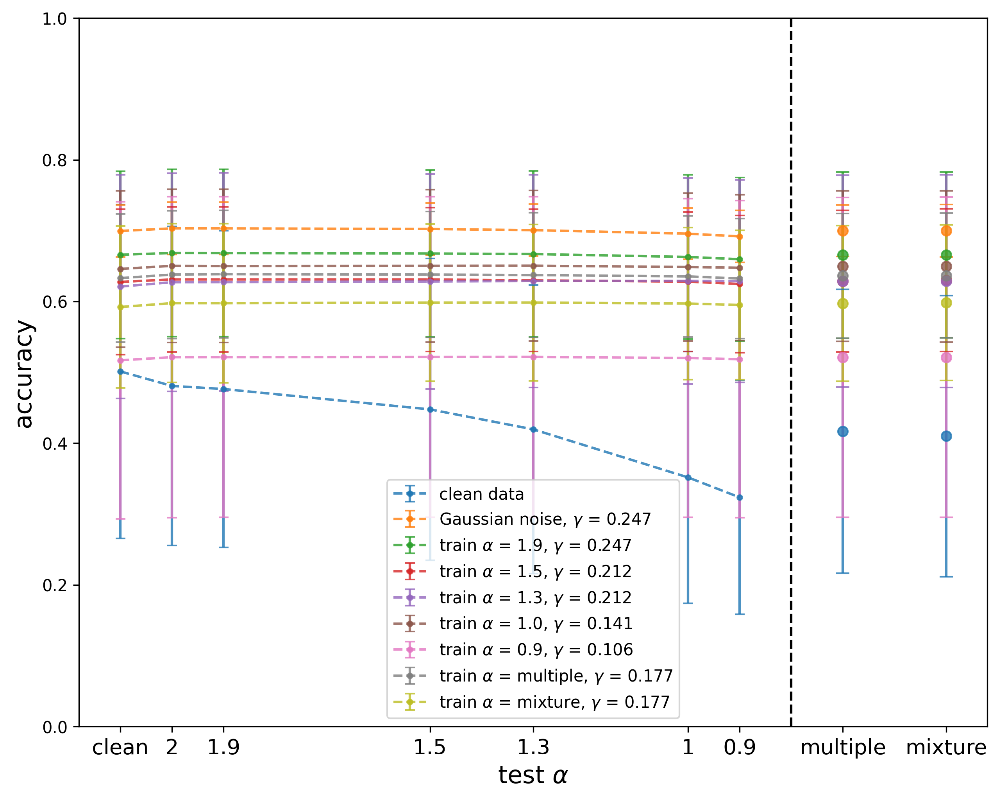

sigmatest= 0.1


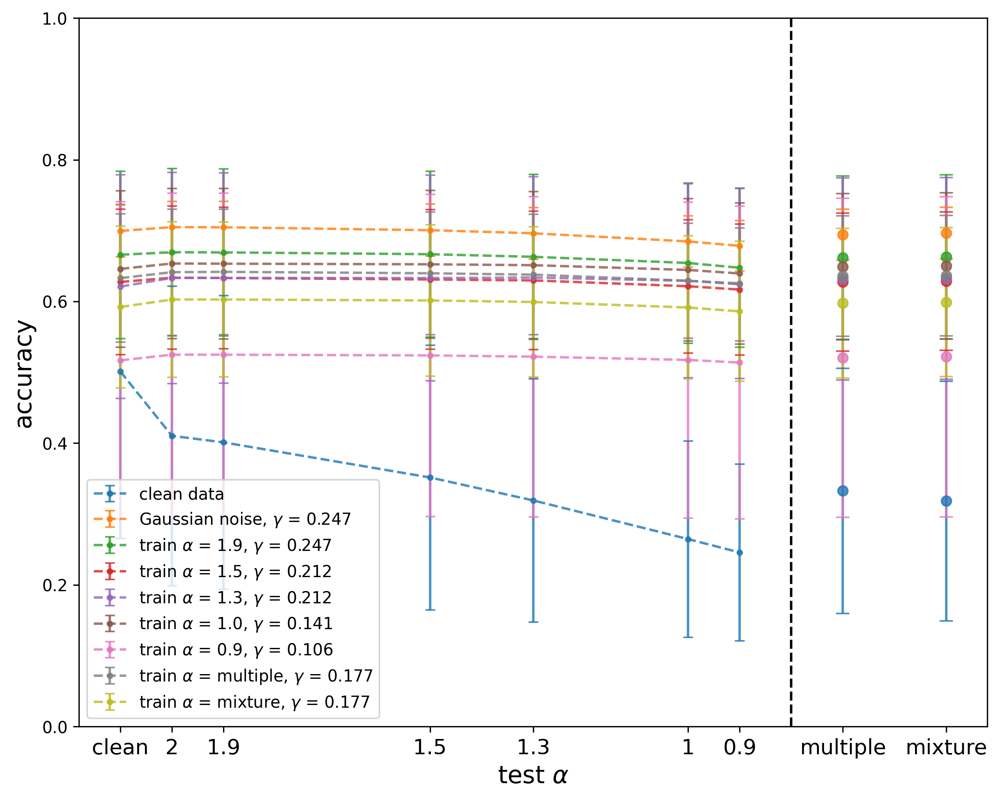

sigmatest= 0.15


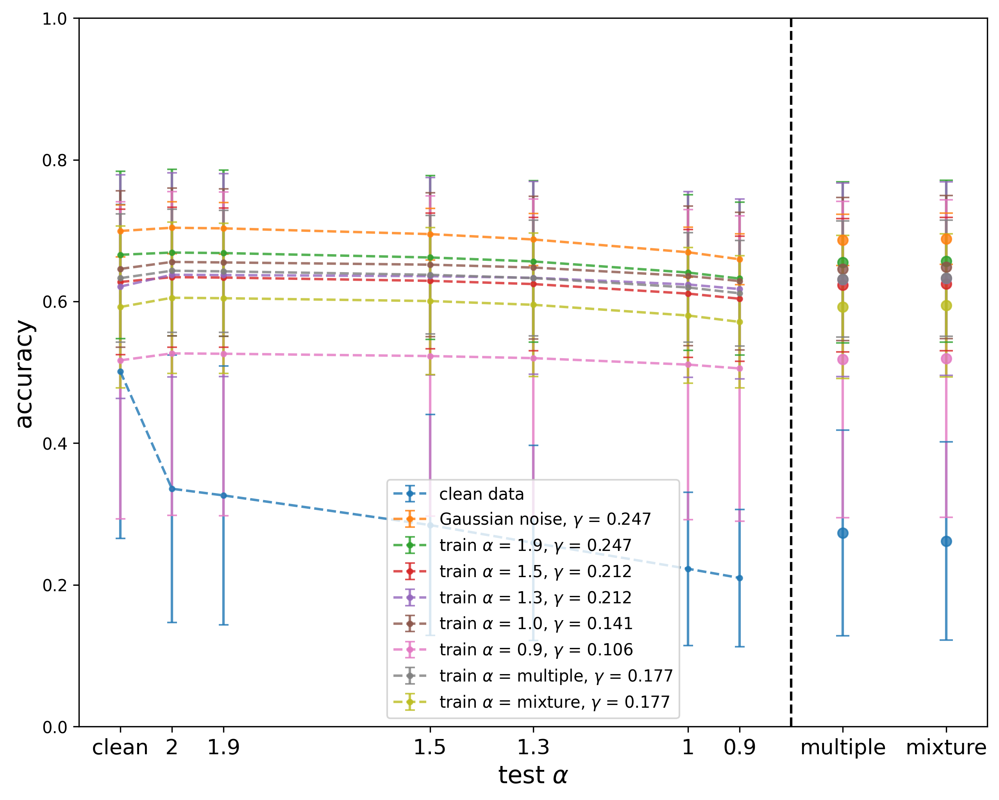

sigmatest= 0.2


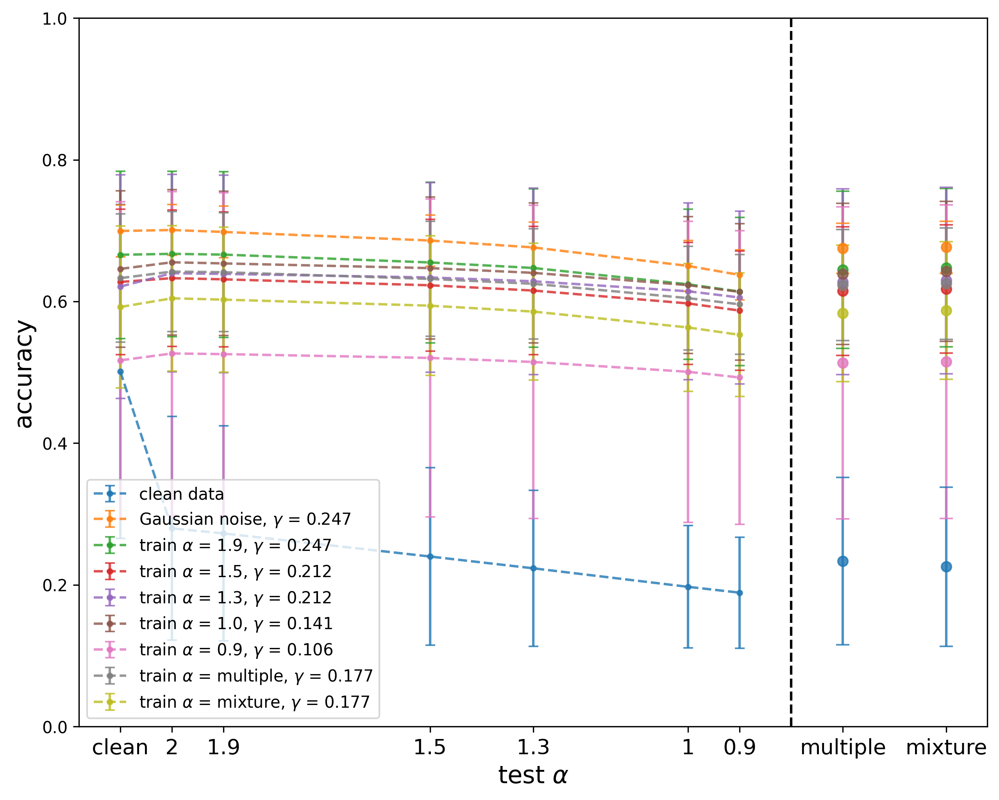

sigmatest= 0.25


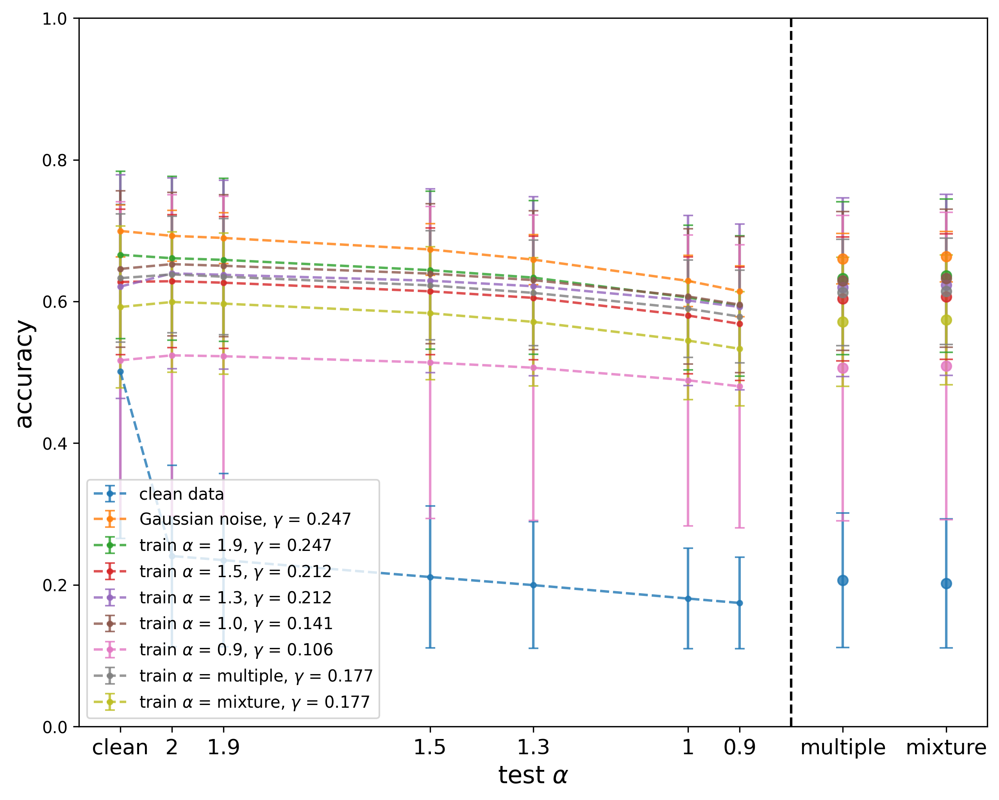

sigmatest= 0.3


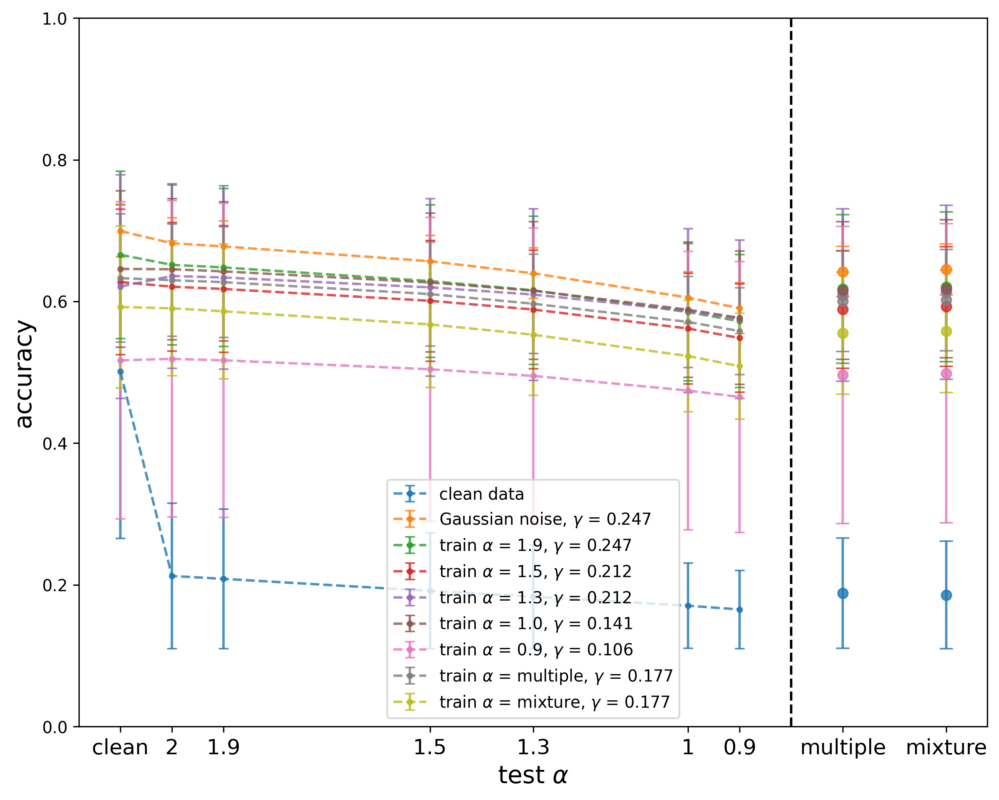

sigmatest= 0.35


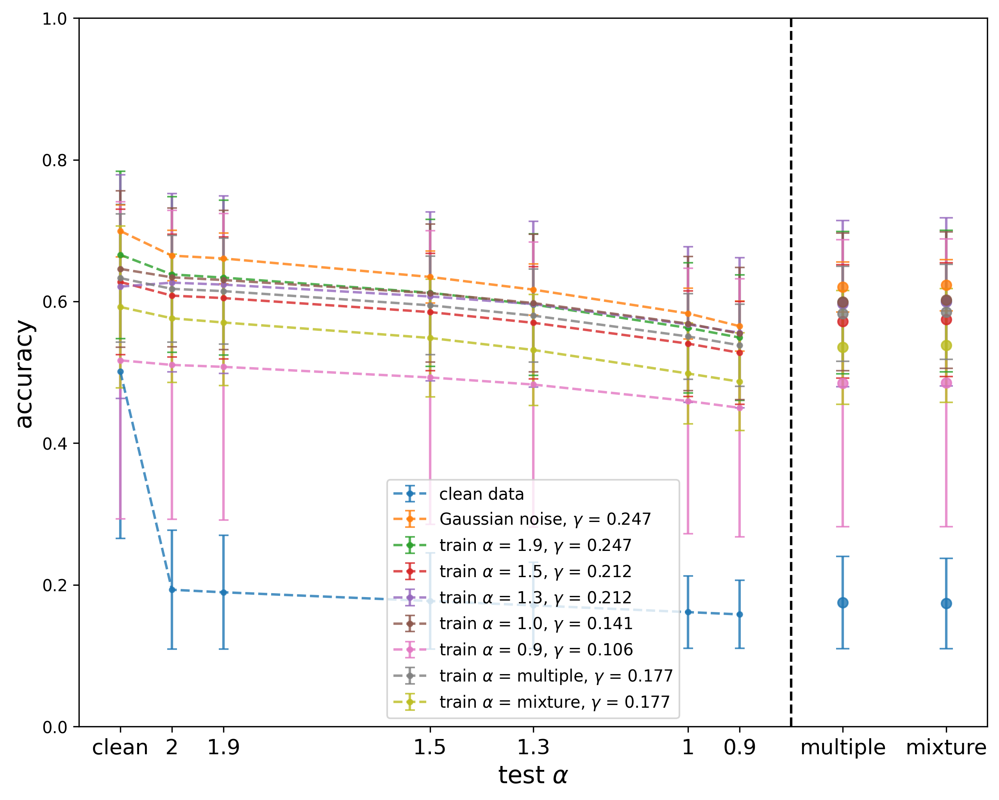

sigmatest= 0.4


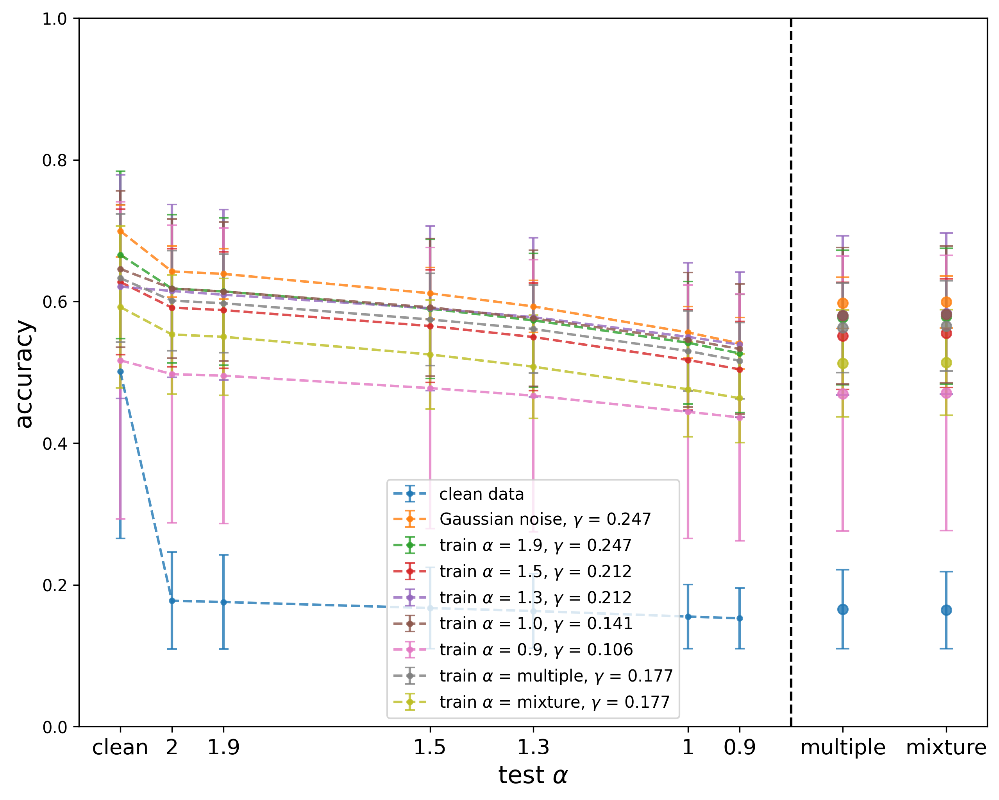

sigmatest= 0.45


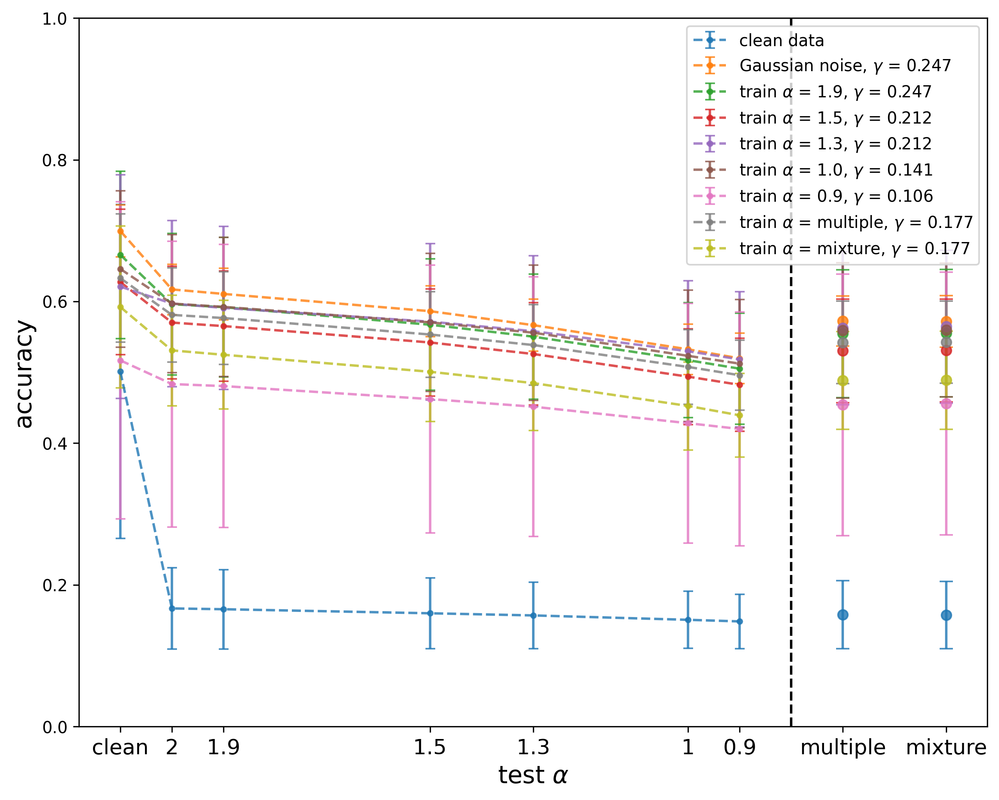

sigmatest= 0.5


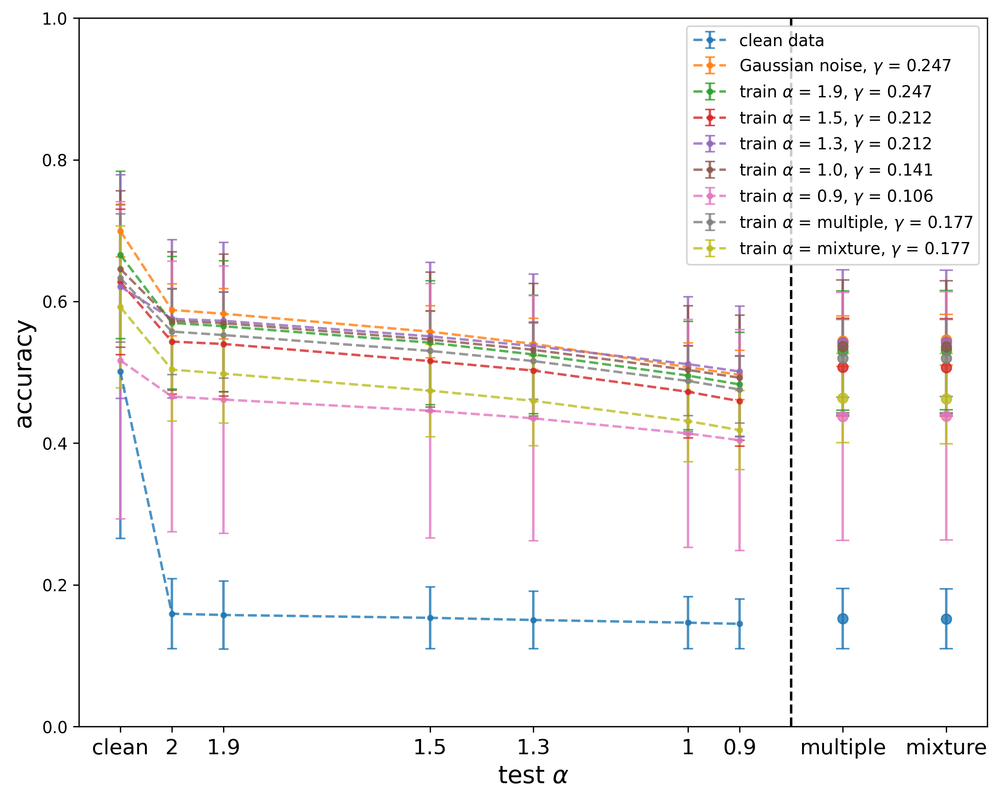

In [16]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
sigmatests = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
# sigmatests = [0.2]
colors = sns.color_palette(n_colors = len(alphatrains))
for sigmatest in sigmatests:
    print('sigmatest=', sigmatest)
    fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
    for i, alphatrain in enumerate(alphatrains):
        sigmatrain = dict_opt_sigma[alphatrain]
        color=colors[i]
        tmp = df[(df['alphatrain']==alphatrain) & ((df['sigmatest']==sigmatest) | (df['alphatest']==0))]
        alpha_to_mean = dict(zip(tmp['alphatest'], tmp['mean']))
        alpha_to_std = dict(zip(tmp['alphatest'], tmp['std']))
        singlealphatests = [0, 2, 1.9, 1.5, 1.3, 1, 0.9]
        means = [alpha_to_mean[a] for a in singlealphatests]
        stds = [alpha_to_std[a] for a in singlealphatests]
        if alphatrain == 0:
            labels = 'clean data'
        elif alphatrain == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
        ax.errorbar([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        combinealphatests = ['multiple', 'mixture']
        means = [alpha_to_mean[a] for a in combinealphatests]
        stds = [alpha_to_std[a] for a in combinealphatests]
        ax.errorbar([0.7, 0.5], means, yerr=stds, fmt='o',capsize=4,alpha=0.8, color = color)
    ax.invert_xaxis()
    plt.axvline(0.8,linestyle='--',color='black')
    plt.legend()
    plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.ylim(0,1)
    plt.xticks([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9]+[0.7, 0.5], ['clean', 2, 1.9, 1.5, 1.3, 1, 0.9]+combinealphatests, fontsize=13)
    plt.show()

average over sigma_test

In [17]:
for sigmatest in df['sigmatest'].unique():
    print(sigmatest)
    print(df[df['sigmatest']==sigmatest].groupby('alphatrain').mean().sort_values('mean', ascending=False))

0.05
            sigmatrain  sigmatest      mean       std
alphatrain                                           
2                 0.35       0.05  0.699542  0.036767
1.9               0.35       0.05  0.665618  0.117173
1                 0.20       0.05  0.649164  0.106724
multiple          0.25       0.05  0.636136  0.088250
1.5               0.30       0.05  0.629071  0.100612
1.3               0.30       0.05  0.627479  0.150553
mixture           0.25       0.05  0.596858  0.110268
0.9               0.15       0.05  0.520442  0.225520
0                 0.10       0.05  0.425292  0.204672
0.1
            sigmatrain  sigmatest      mean       std
alphatrain                                           
2                 0.35        0.1  0.695079  0.036280
1.9               0.35        0.1  0.661861  0.115803
1                 0.20        0.1  0.649210  0.103309
multiple          0.25        0.1  0.635813  0.085038
1.3               0.30        0.1  0.631518  0.142659
1.5               0

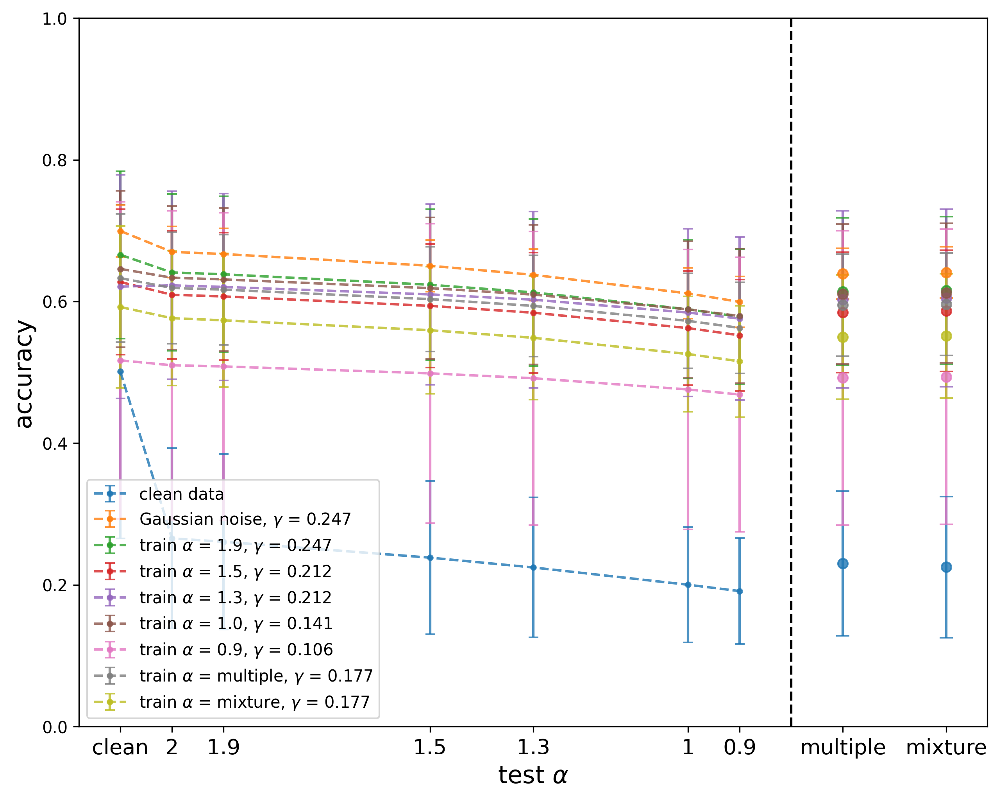

In [18]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
# sigmatests = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
sigmatests = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
colors = sns.color_palette(n_colors = len(alphatrains))
fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
for i, alphatrain in enumerate(alphatrains):
    sigmatrain = dict_opt_sigma[alphatrain]
    color=colors[i]
    tmp = df[(df['alphatrain']==alphatrain)].groupby('alphatest')[['mean','std']].mean().reset_index()
    alpha_to_mean = dict(zip(tmp['alphatest'], tmp['mean']))
    alpha_to_std = dict(zip(tmp['alphatest'], tmp['std']))
    singlealphatests = [0, 2, 1.9, 1.5, 1.3, 1, 0.9]
    means = [alpha_to_mean[a] for a in singlealphatests]
    stds = [alpha_to_std[a] for a in singlealphatests]
    if alphatrain == 0:
        labels = 'clean data'
    elif alphatrain == 2:
        labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
    else:
        labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
    ax.errorbar([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
    combinealphatests = ['multiple', 'mixture']
    means = [alpha_to_mean[a] for a in combinealphatests]
    stds = [alpha_to_std[a] for a in combinealphatests]
    ax.errorbar([0.7, 0.5], means, yerr=stds, fmt='o',capsize=4,alpha=0.8, color = color)
ax.invert_xaxis()
plt.axvline(0.8,linestyle='--',color='black')
plt.legend()
plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
plt.ylabel("accuracy",fontsize=15)#纵坐标名字
plt.ylim(0,1)
plt.xticks([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9]+[0.7, 0.5], ['clean', 2, 1.9, 1.5, 1.3, 1, 0.9]+combinealphatests, fontsize=13)
plt.show()

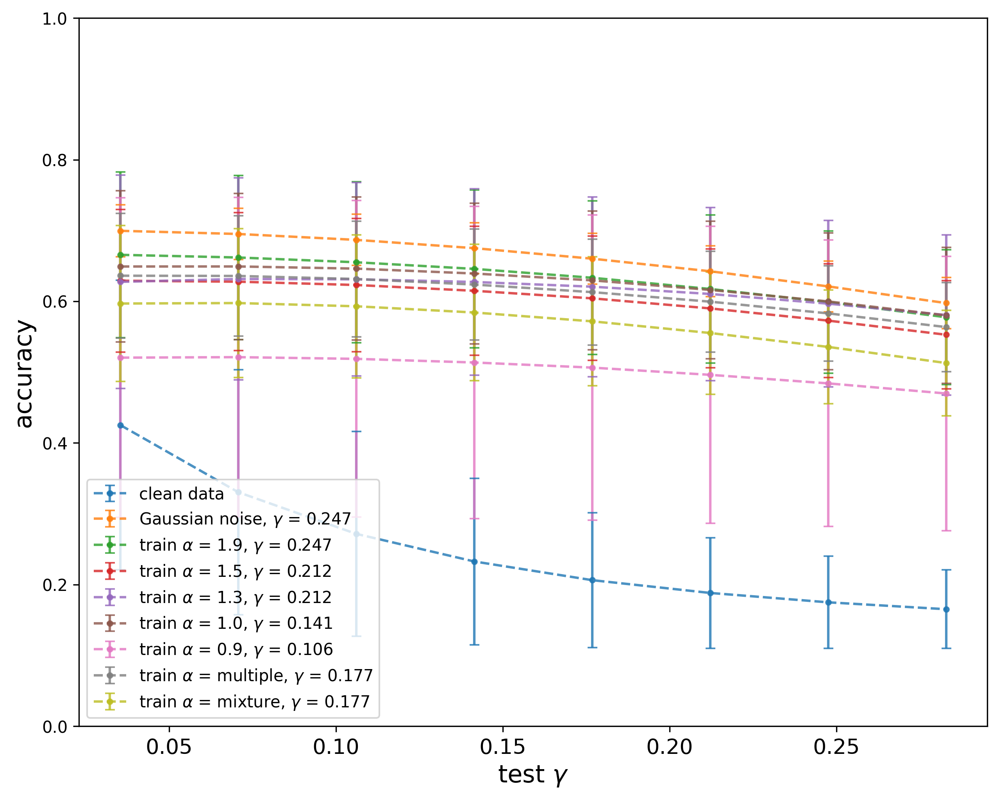

In [20]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
sigmatests = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4]
colors = sns.color_palette(n_colors = len(alphatrains))
fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
for i, alphatrain in enumerate(alphatrains):
    sigmatrain = dict_opt_sigma[alphatrain]
    color=colors[i]
    tmp = df[(df['alphatrain']==alphatrain)].groupby('sigmatest')[['mean','std']].mean().reset_index()
    sigma_to_mean = dict(zip(tmp['sigmatest'], tmp['mean']))
    sigma_to_std = dict(zip(tmp['sigmatest'], tmp['std']))
    means = [sigma_to_mean[a] for a in sigmatests]
    stds = [sigma_to_std[a] for a in sigmatests]
    if alphatrain == 0:
        labels = 'clean data'
    elif alphatrain == 2:
        labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
    else:
        labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
    ax.errorbar([np.sqrt(0.5)*s for s in sigmatests],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
plt.legend()
plt.xlabel("test $\gamma$",fontsize=15)#横坐标名字
plt.ylabel("accuracy",fontsize=15)#纵坐标名字
plt.ylim(0,1)
plt.xticks(fontsize=13)
plt.show()

In [16]:
df[df['sigmatest'].isin([0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4])].groupby(['alphatrain', 'sigmatrain'])['mean'].mean().sort_values(ascending=False)

alphatrain  sigmatrain
1.3         0.30          0.715271
multiple    0.25          0.715159
1.9         0.35          0.713996
1.5         0.30          0.713470
1           0.20          0.703008
0.9         0.15          0.699488
mixture     0.25          0.699294
2           0.35          0.698595
0           0.10          0.440342
Name: mean, dtype: float64

In [19]:
import keras
print(keras.__version__) # 注意version前后各有两个下划线

2.4.3


# LSTM on libras
## find optimal sigma according to testing accuracy on sigmatest=0.3

In [4]:
width = 128
depth = 1
lr = 0.001
iter = 1500
df = []
for alphatrain in [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 'multiple', 'mixture']:
    for sigmatrain in [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
        if alphatrain == 0:
            sigmatrain = 0.05
        for alphatest in [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 'multiple', 'mixture']:
            sigmatest = 0.3
            acc_path = f"../results20231202/acc_LSTM_width{width}_depth{depth}_b32_alphatrain{alphatrain}_sigmatrain{sigmatrain}_lr{lr}_iter{iter}_alphatest{alphatest}_sigmatest{sigmatest}.txt"
            if alphatest == 0:
                list_acc_path = [name for name in os.listdir('../results20231202/') if f"acc_LSTM_width{width}_depth{depth}_b32_alphatrain{alphatrain}_sigmatrain{sigmatrain}_lr{lr}_iter{iter}_alphatest{alphatest}" in name]
                if len(list_acc_path) >0:
                    acc_path = "../results20231202/"+list_acc_path[0]
                else:
                    print('no exists, alphatest=0')
                    continue
            if os.path.exists(acc_path) == 0:
                print('no exists,', acc_path)
                continue
            f = open(acc_path, 'rb')
            acc = pickle.load(f)
            df.append([alphatrain, sigmatrain, alphatest, sigmatest, np.mean(acc), np.std(acc)])
        if alphatrain == 0:
            break

In [5]:
df

[[0.0, 0.05, 0.0, 0.3, 0.7177777767181397, 0.027977057223784414],
 [0.0, 0.05, 2.0, 0.3, 0.5882222175598144, 0.019023684005125628],
 [0.0, 0.05, 1.9, 0.3, 0.5768888831138611, 0.012951000067571708],
 [0.0, 0.05, 1.5, 0.3, 0.4364444375038147, 0.014650661578442793],
 [0.0, 0.05, 1.3, 0.3, 0.3439999997615814, 0.009796692676403278],
 [0.0, 0.05, 1.0, 0.3, 0.2232222229242325, 0.014226562973071396],
 [0.0, 0.05, 0.9, 0.3, 0.19155555963516235, 0.011644954726605454],
 [0.0, 0.05, 'multiple', 0.3, 0.40018519163131716, 0.015475990474219358],
 [0.0, 0.05, 'mixture', 0.3, 0.41744444370269773, 0.021888049256815475],
 [2.0, 0.05, 0.0, 0.3, 0.7322222113609314, 0.027532261720750423],
 [2.0, 0.05, 2.0, 0.3, 0.6151111125946045, 0.0066610982660362745],
 [2.0, 0.05, 1.9, 0.3, 0.6025555491447449, 0.006446358241270613],
 [2.0, 0.05, 1.5, 0.3, 0.4598888874053955, 0.012567839590182716],
 [2.0, 0.05, 1.3, 0.3, 0.37844444513320924, 0.014518616153797828],
 [2.0, 0.05, 1.0, 0.3, 0.24666666686534883, 0.014080899673

In [6]:
df = pd.DataFrame(df, columns=['alphatrain', 'sigmatrain', 'alphatest', 'sigmatest', 'mean', 'std'])

In [7]:
df['alphatrain'].unique()

array([0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 'multiple', 'mixture'],
      dtype=object)

In [8]:
dict_opt_sigma = {}
dict_opt_sigma[0]=0.05
for alphatrain in [0, 2, 1.9, 1.5, 1.3, 1, 0.9, 'multiple', 'mixture']:
# for alphatrain in [2]:
    tmp = df[(df['alphatrain']==alphatrain) & (df['alphatest'].isin([0,2,1.9,1.5,1.3,1,0.9,'multiple','mixture']))]
    if len(tmp) < 90:
        print(alphatrain, '结果不完整', len(tmp))
        continue
    opt_sigma = tmp.groupby('sigmatrain')['mean'].mean().idxmax().copy()
    dict_opt_sigma[alphatrain] = opt_sigma
    print(alphatrain, opt_sigma)

0 结果不完整 9
2 0.4
1.9 0.4
1.5 0.5
1.3 0.35
1 0.2
0.9 0.2
multiple 0.3
mixture 0.05


In [9]:
dict_opt_sigma

{0: 0.05,
 2: 0.4,
 1.9: 0.4,
 1.5: 0.5,
 1.3: 0.35,
 1: 0.2,
 0.9: 0.2,
 'multiple': 0.3,
 'mixture': 0.05}

## 确定最优sigmatrain后，读取在不同sigmatest上的结果，画图

In [27]:
width = 128
depth = 3
lr = 0.001
iter = 1500
df = []
for alphatrain in [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 'multiple', 'mixture']:
    sigmatrain = dict_opt_sigma[alphatrain]
    for alphatest in [0.0, 2.0, 1.9, 1.5, 1.3, 1.0, 0.9, 'multiple', 'mixture']:
        for sigmatest in [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
            acc_path = f"../results20231202/acc_LSTM_width{width}_depth{depth}_b32_alphatrain{alphatrain}_sigmatrain{sigmatrain}_lr{lr}_iter{iter}_alphatest{alphatest}_sigmatest{sigmatest}.txt"
            if alphatest == 0:
                list_acc_path = [name for name in os.listdir('../results20231202/') if f"acc_LSTM_width{width}_depth{depth}_b32_alphatrain{alphatrain}_sigmatrain{sigmatrain}_lr{lr}_iter{iter}_alphatest{alphatest}" in name]
                if len(list_acc_path) >0:
                    acc_path = "../results20231202/"+list_acc_path[0]
                else:
                    print('no exists, alphatest=0, alphatrain={}, sigmatrain={}'.format(alphatrain, sigmatrain))
                    continue
            if os.path.exists(acc_path) == 0:
                print('no exists,', acc_path)
                continue
            f = open(acc_path, 'rb')
            acc = pickle.load(f)
            df.append([alphatrain, sigmatrain, alphatest, sigmatest, np.mean(acc), np.std(acc)])
            if alphatest == 0:
                break

In [28]:
df = pd.DataFrame(df, columns=['alphatrain', 'sigmatrain', 'alphatest', 'sigmatest', 'mean', 'std'])

sigmatest= 0.05


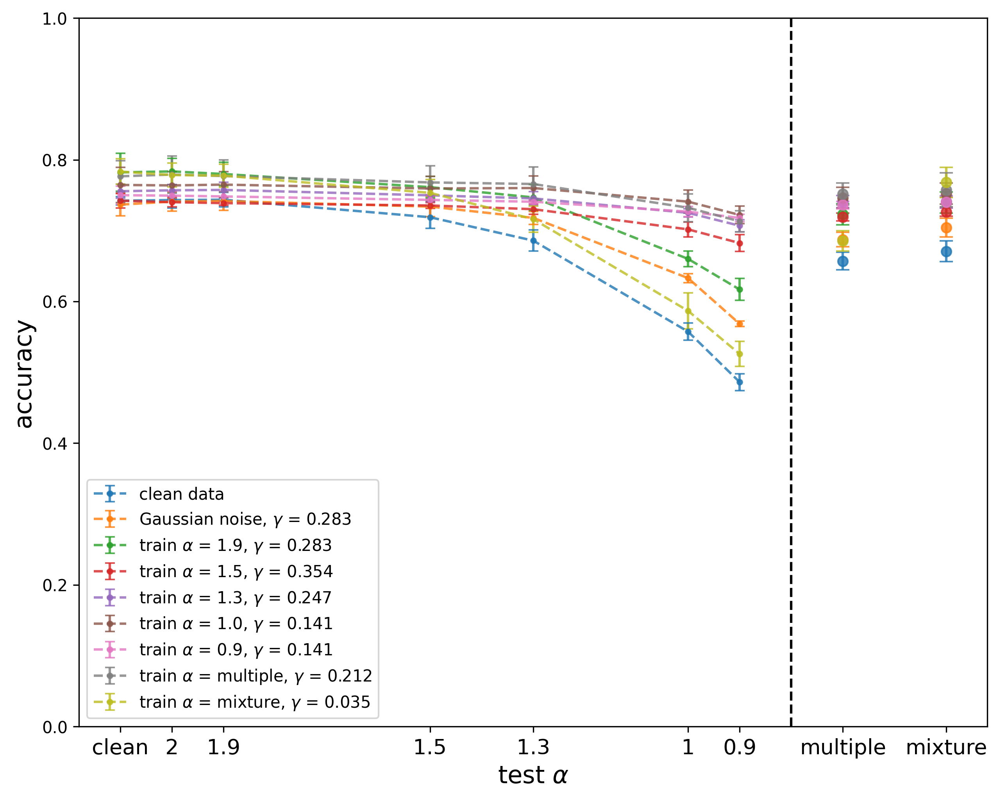

sigmatest= 0.1


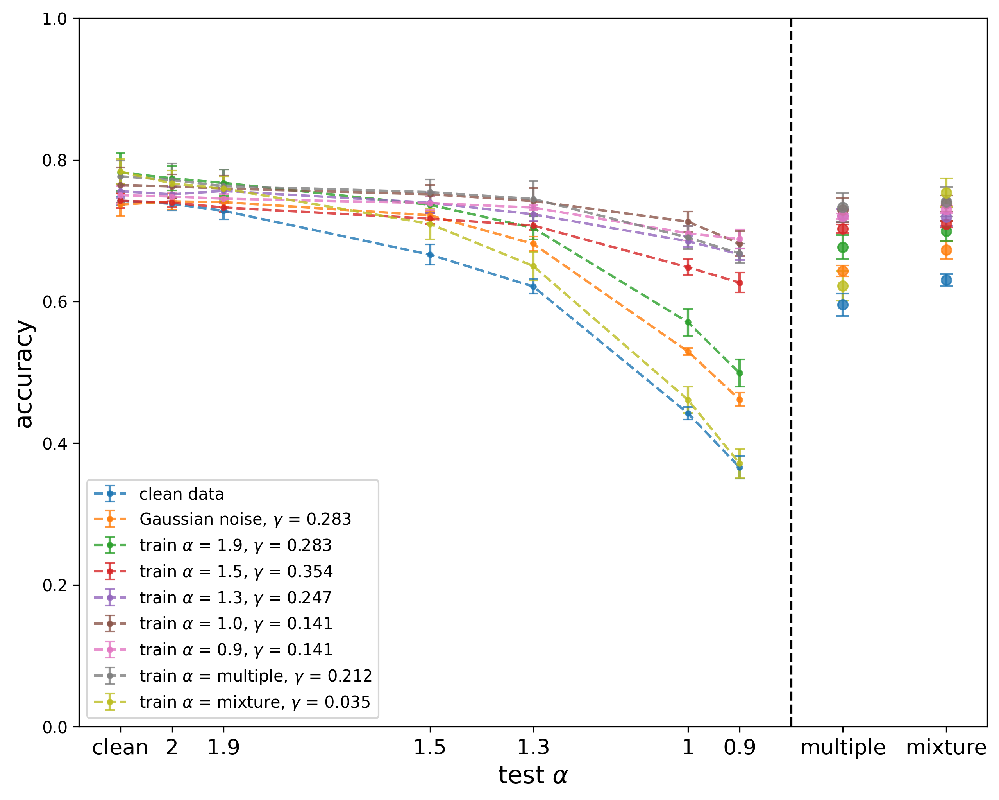

sigmatest= 0.15


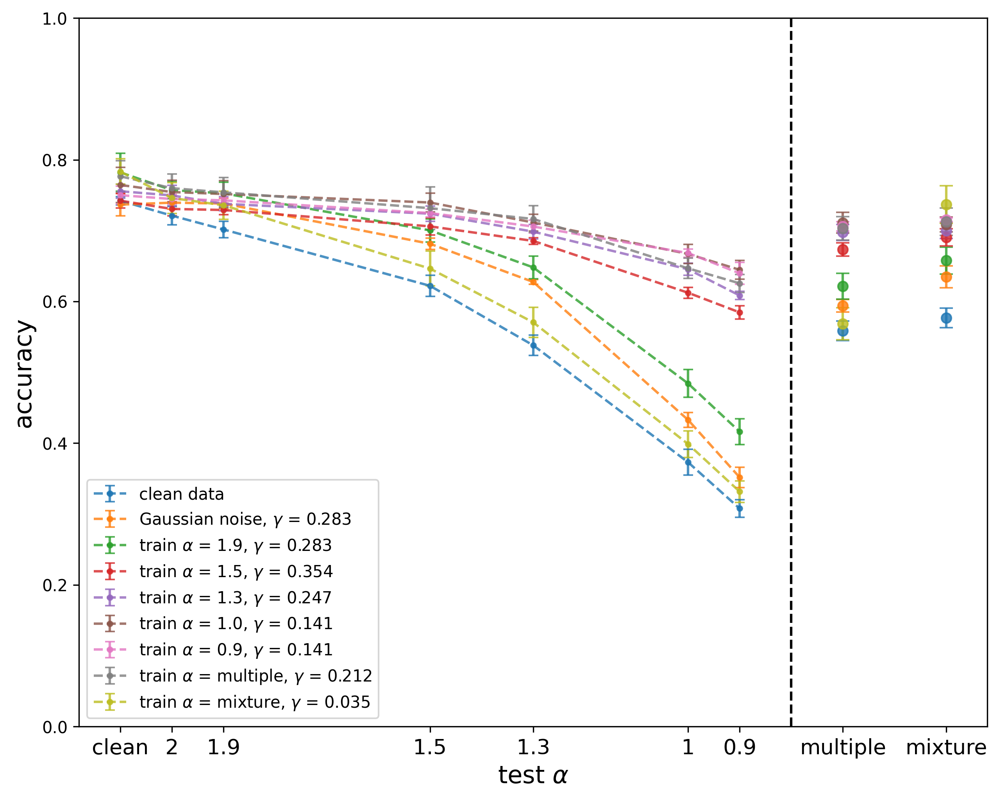

sigmatest= 0.2


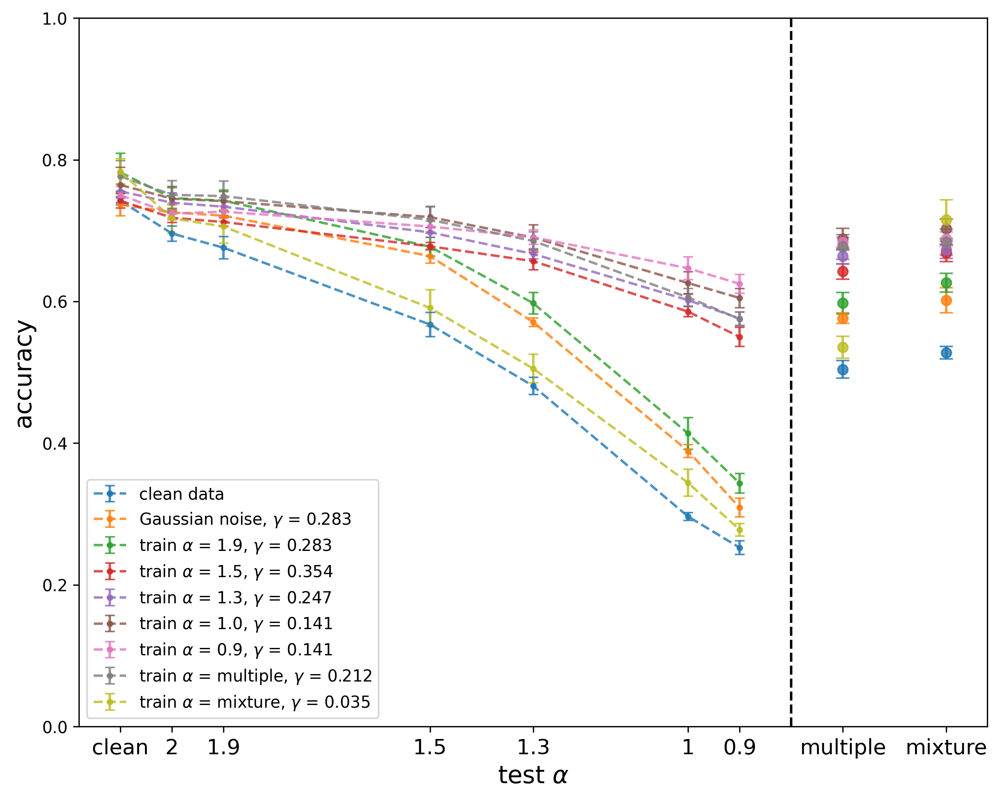

sigmatest= 0.25


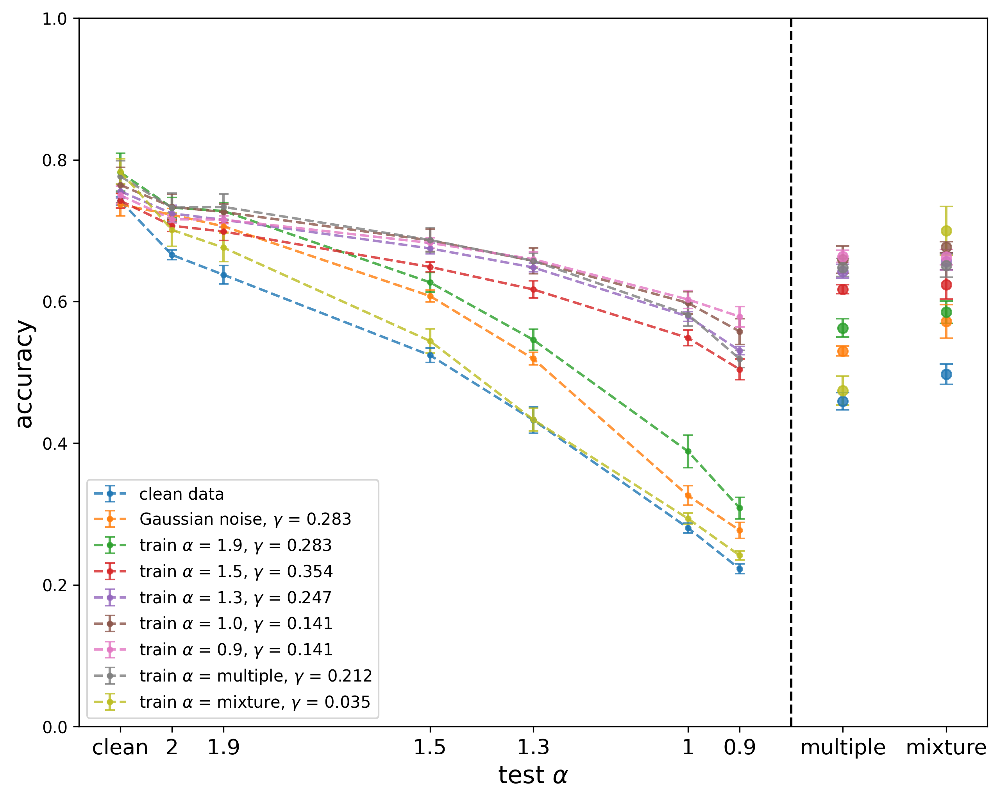

sigmatest= 0.3


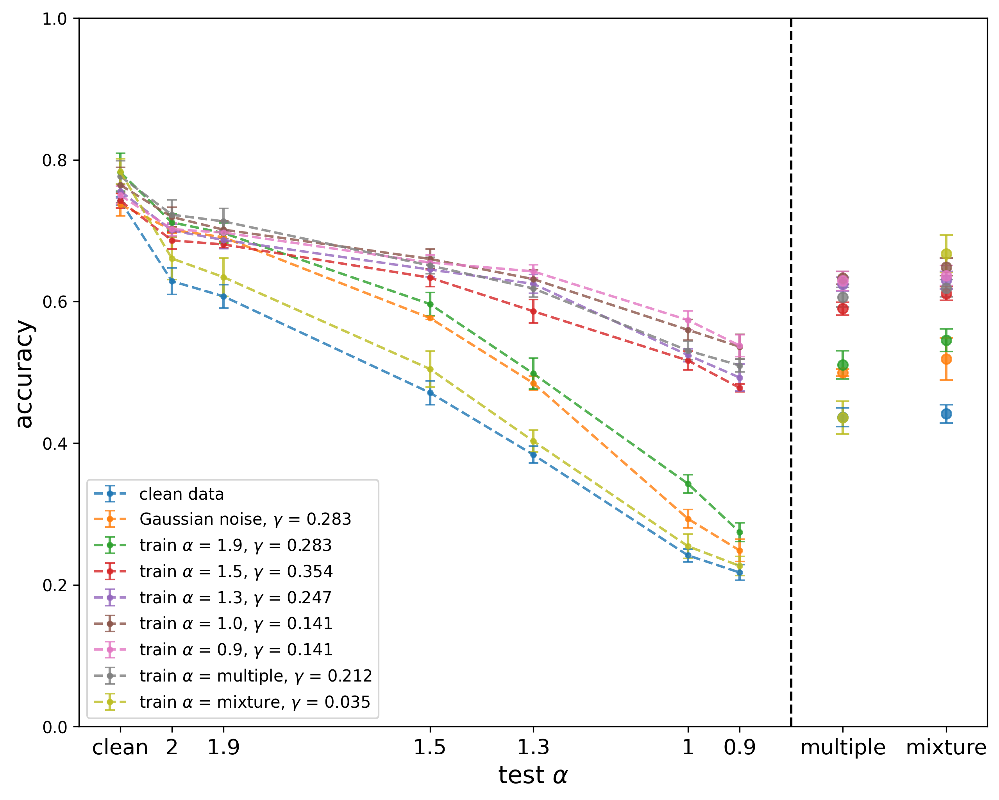

sigmatest= 0.35


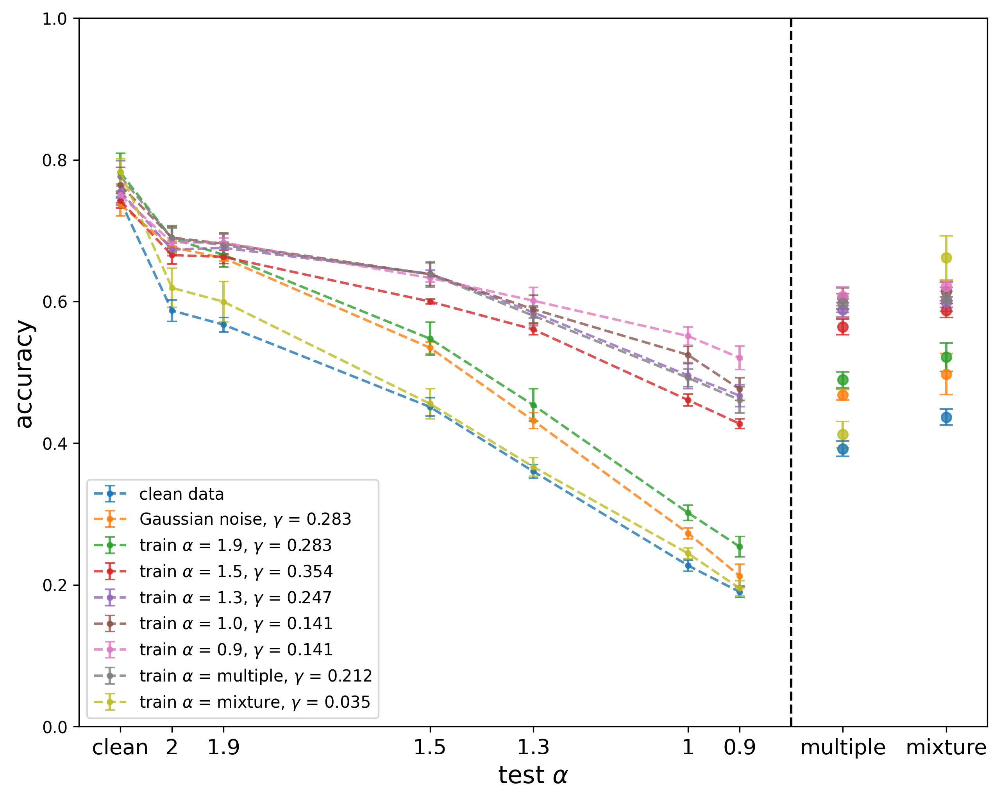

sigmatest= 0.4


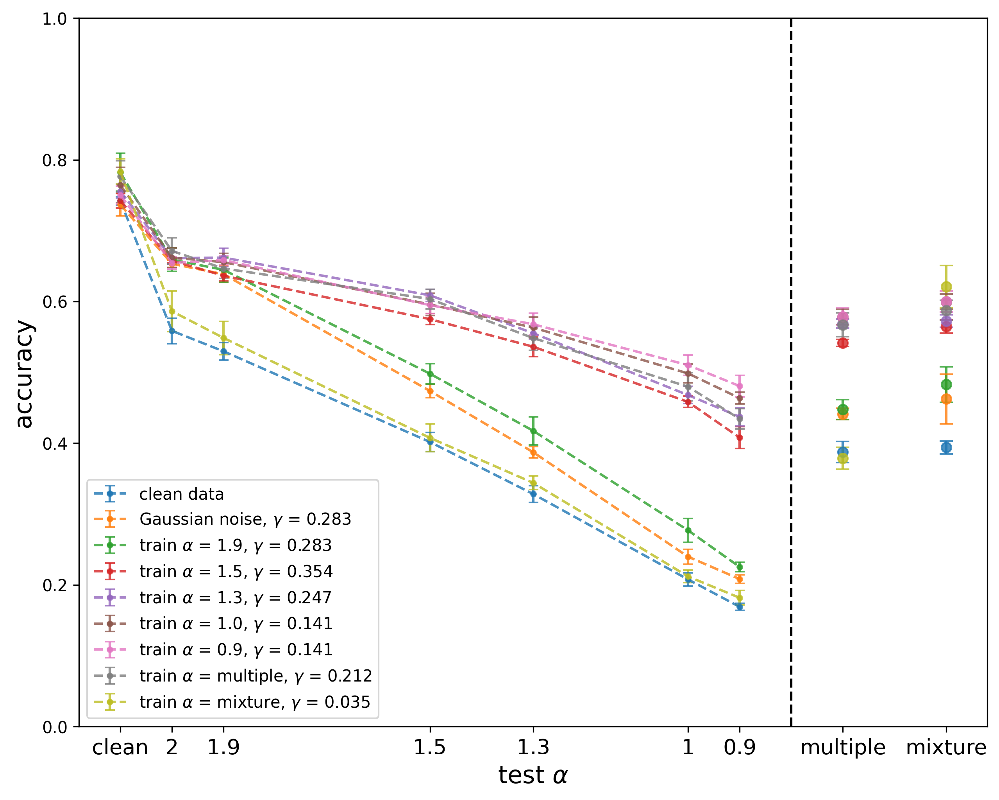

sigmatest= 0.45


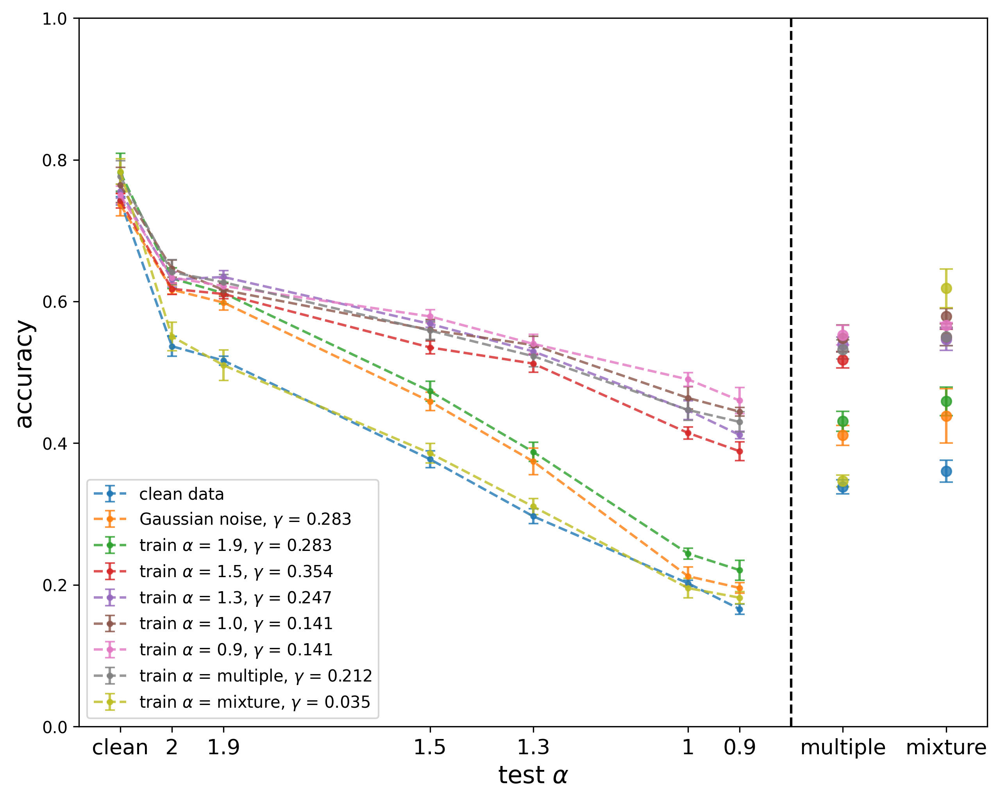

sigmatest= 0.5


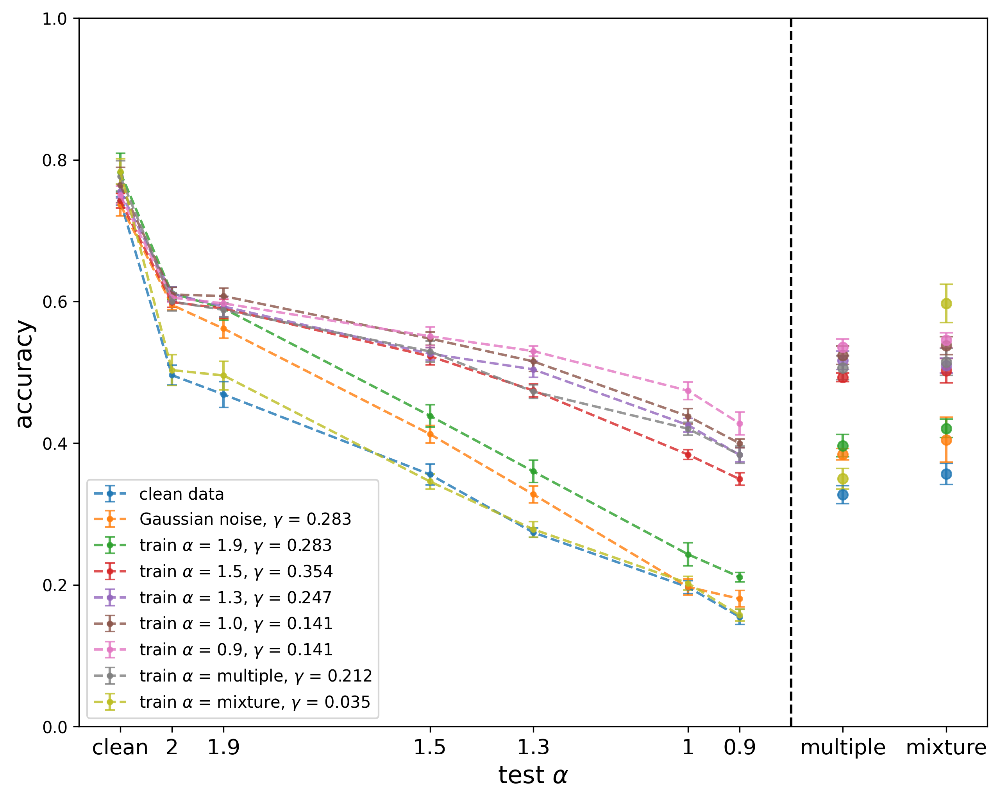

In [29]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
sigmatests = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
colors = sns.color_palette(n_colors = len(alphatrains))
for sigmatest in [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
    print('sigmatest=', sigmatest)
    fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
    for i, alphatrain in enumerate(alphatrains):
        sigmatrain = dict_opt_sigma[alphatrain]
        color=colors[i]
        tmp = df[(df['alphatrain']==alphatrain) & ((df['sigmatest']==sigmatest) | (df['alphatest']==0))]
        alpha_to_mean = dict(zip(tmp['alphatest'], tmp['mean']))
        alpha_to_std = dict(zip(tmp['alphatest'], tmp['std']))
        singlealphatests = [0, 2, 1.9, 1.5, 1.3, 1, 0.9]
        means = [alpha_to_mean[a] for a in singlealphatests]
        stds = [alpha_to_std[a] for a in singlealphatests]
        if alphatrain == 0:
            labels = 'clean data'
        elif alphatrain == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
        ax.errorbar([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        combinealphatests = ['multiple', 'mixture']
        means = [alpha_to_mean[a] for a in combinealphatests]
        stds = [alpha_to_std[a] for a in combinealphatests]
        ax.errorbar([0.7, 0.5], means, yerr=stds, fmt='o',capsize=4,alpha=0.8, color = color)
    ax.invert_xaxis()
    plt.axvline(0.8,linestyle='--',color='black')
    plt.legend()
    plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.ylim(0,1)
    plt.xticks([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9]+[0.7, 0.5], ['clean', 2, 1.9, 1.5, 1.3, 1, 0.9]+combinealphatests, fontsize=13)
    plt.show()

average over sigma_test

sigmatest= 0.05


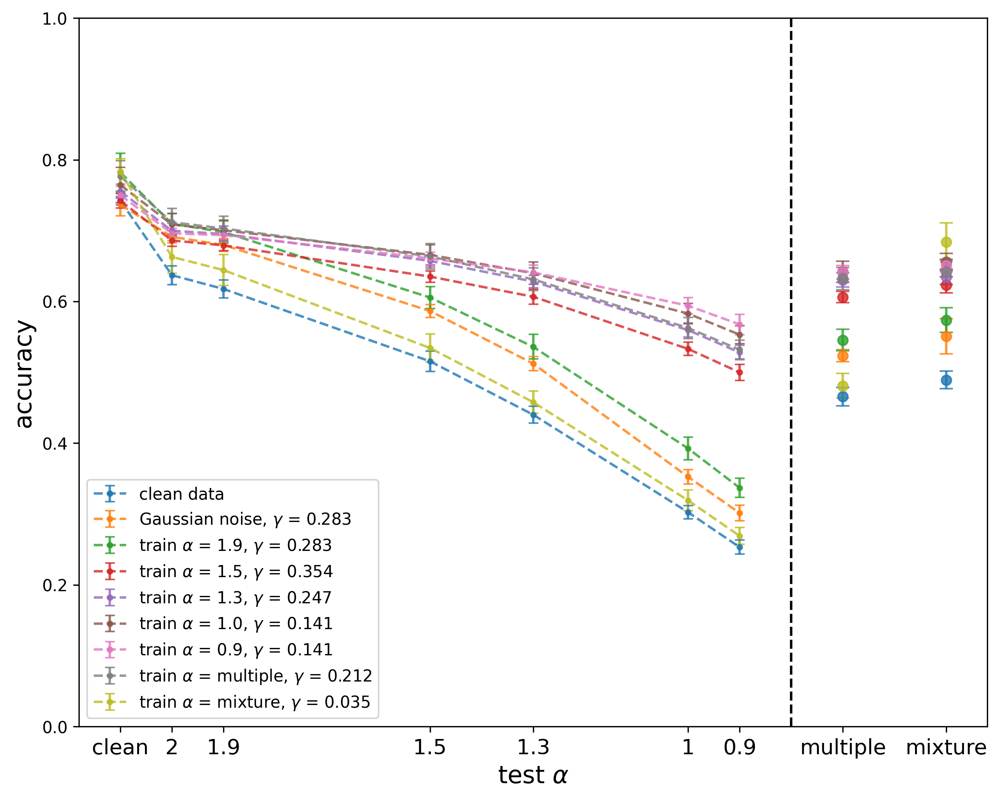

sigmatest= 0.1


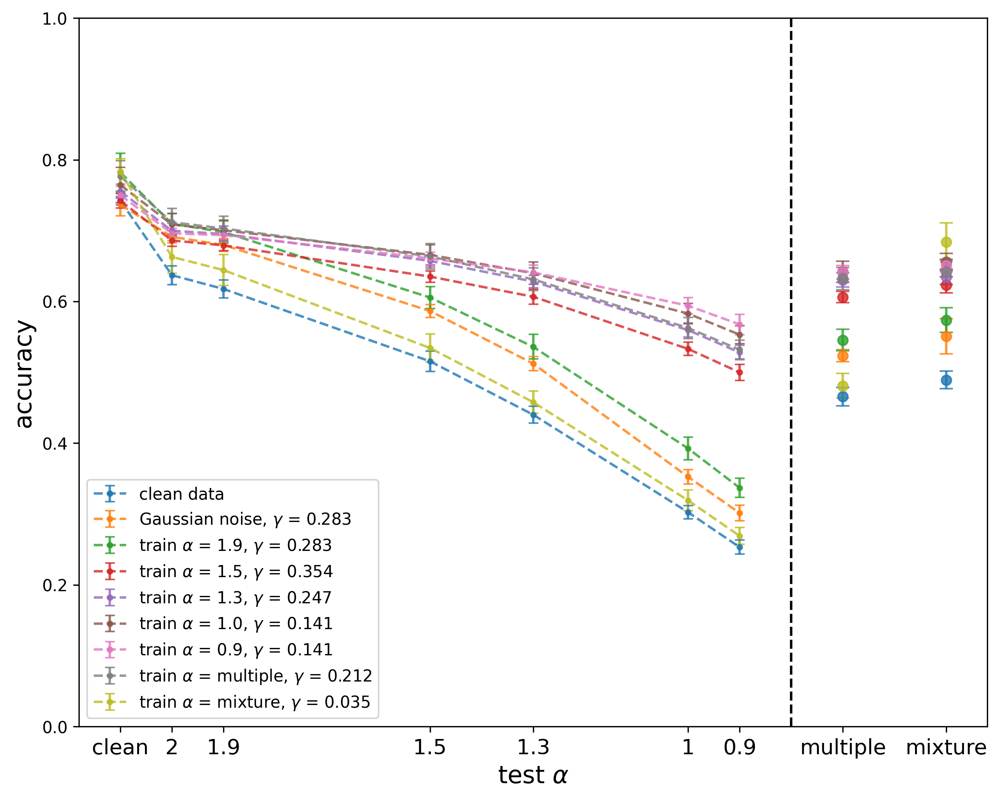

sigmatest= 0.15


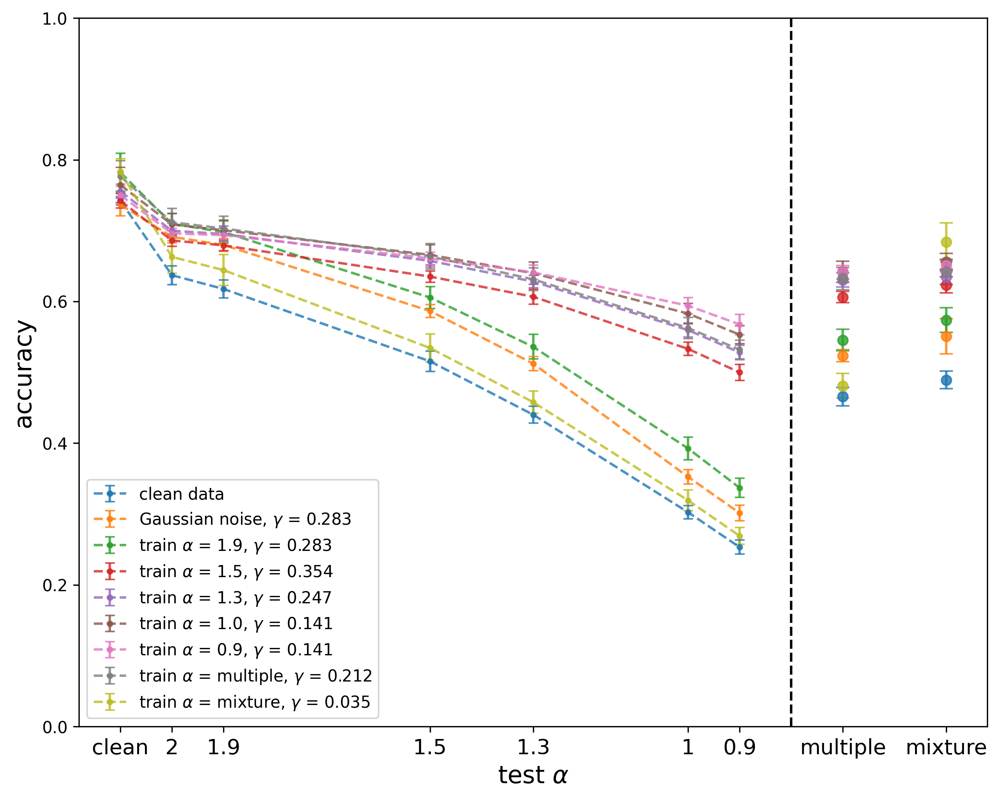

sigmatest= 0.2


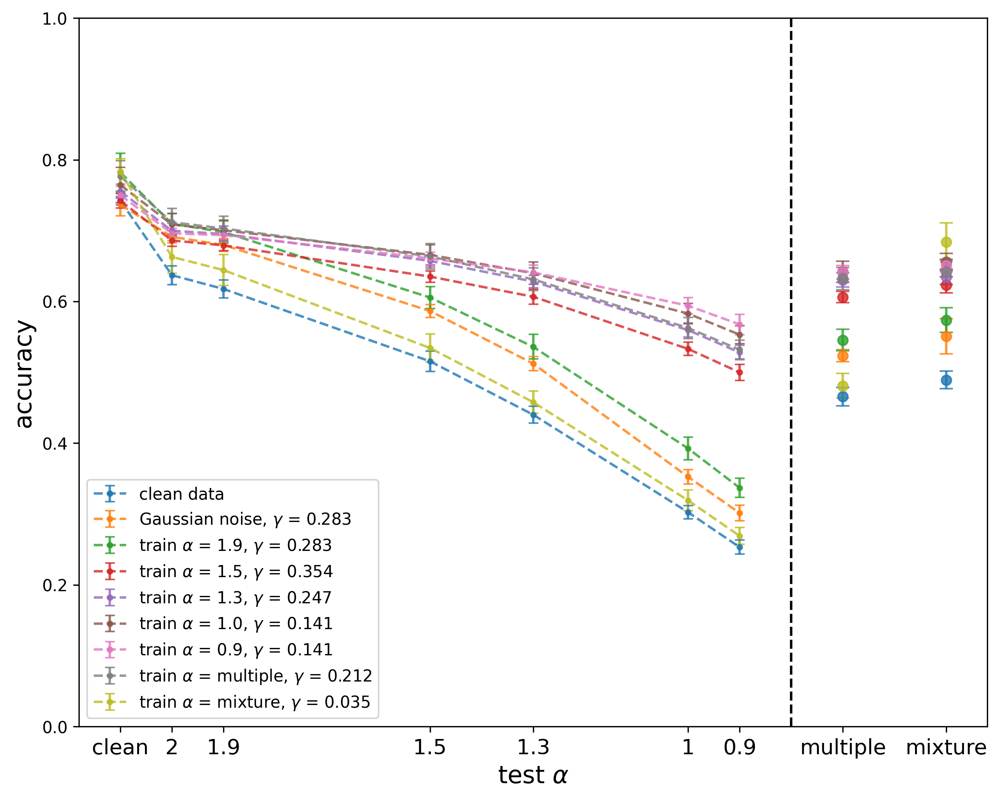

sigmatest= 0.25


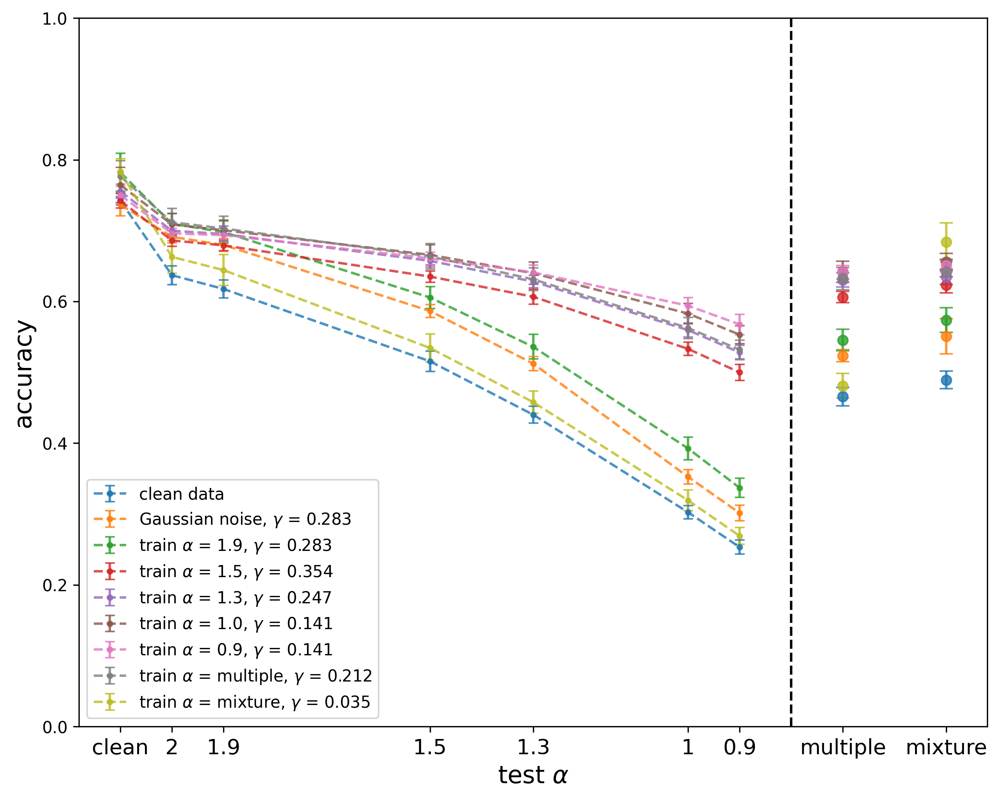

sigmatest= 0.3


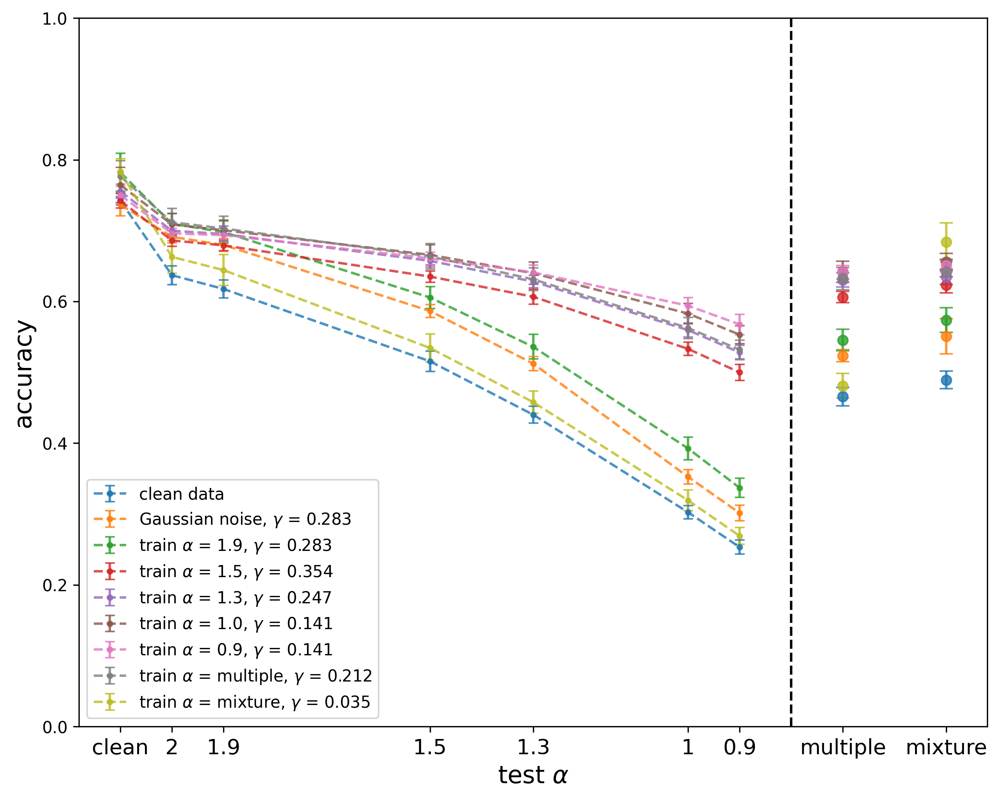

sigmatest= 0.35


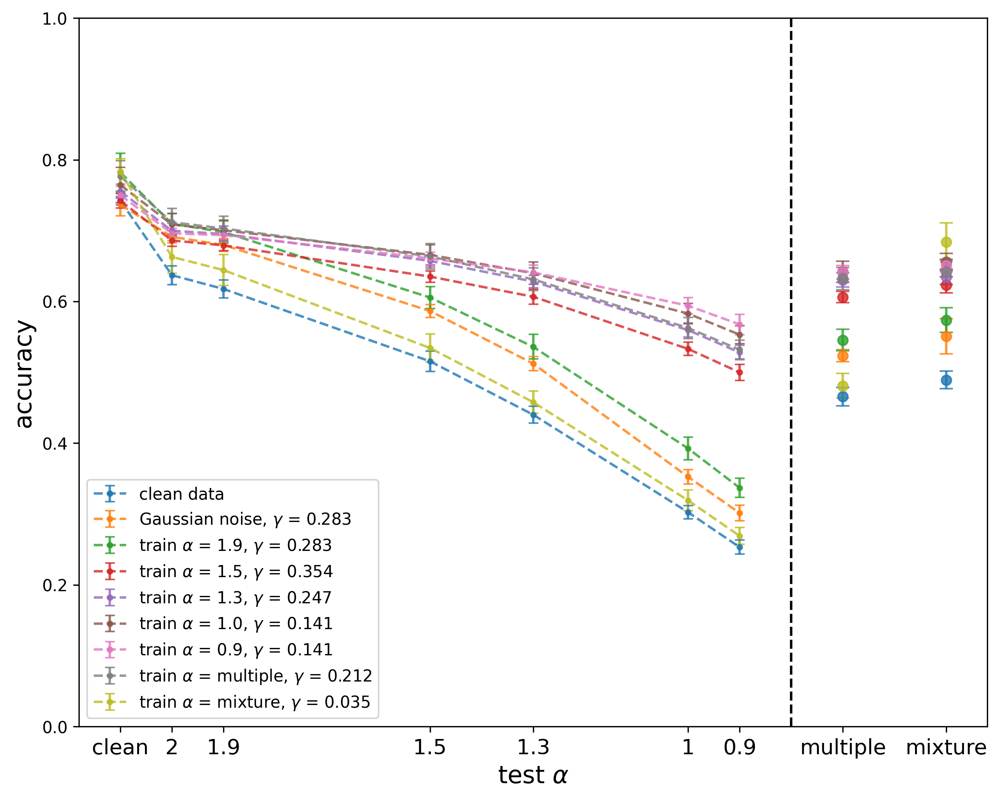

sigmatest= 0.4


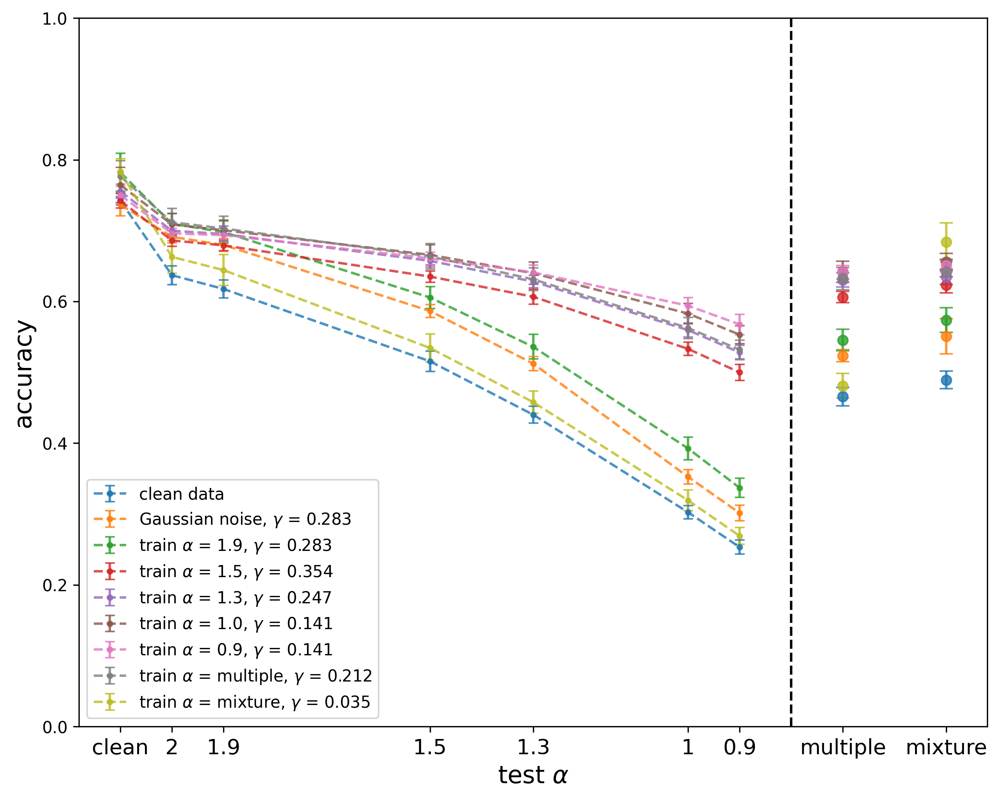

sigmatest= 0.45


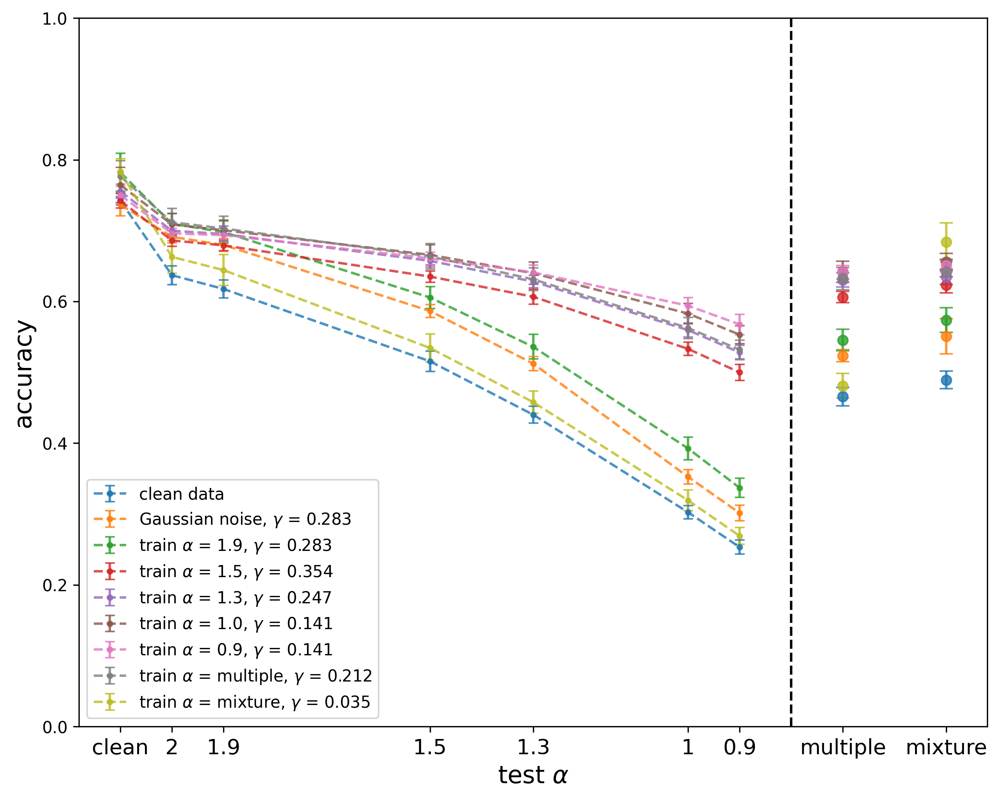

sigmatest= 0.5


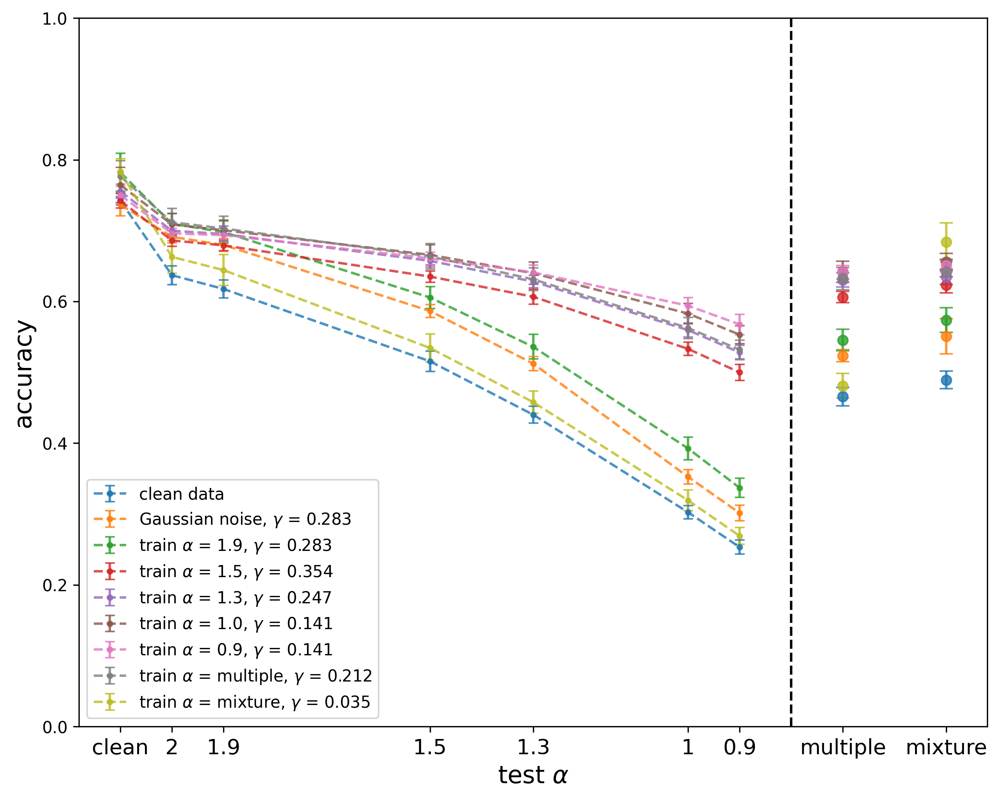

In [30]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
sigmatests = [0, 0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
colors = sns.color_palette(n_colors = len(alphatrains))
for sigmatest in [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]:
    print('sigmatest=', sigmatest)
    fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
    for i, alphatrain in enumerate(alphatrains):
        sigmatrain = dict_opt_sigma[alphatrain]
        color=colors[i]
        tmp = df[(df['alphatrain']==alphatrain)].groupby('alphatest')[['mean','std']].mean().reset_index()
        alpha_to_mean = dict(zip(tmp['alphatest'], tmp['mean']))
        alpha_to_std = dict(zip(tmp['alphatest'], tmp['std']))
        singlealphatests = [0, 2, 1.9, 1.5, 1.3, 1, 0.9]
        means = [alpha_to_mean[a] for a in singlealphatests]
        stds = [alpha_to_std[a] for a in singlealphatests]
        if alphatrain == 0:
            labels = 'clean data'
        elif alphatrain == 2:
            labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
        else:
            labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
        ax.errorbar([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
        combinealphatests = ['multiple', 'mixture']
        means = [alpha_to_mean[a] for a in combinealphatests]
        stds = [alpha_to_std[a] for a in combinealphatests]
        ax.errorbar([0.7, 0.5], means, yerr=stds, fmt='o',capsize=4,alpha=0.8, color = color)
    ax.invert_xaxis()
    plt.axvline(0.8,linestyle='--',color='black')
    plt.legend()
    plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
    plt.ylabel("accuracy",fontsize=15)#纵坐标名字
    plt.ylim(0,1)
    plt.xticks([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9]+[0.7, 0.5], ['clean', 2, 1.9, 1.5, 1.3, 1, 0.9]+combinealphatests, fontsize=13)
    plt.show()

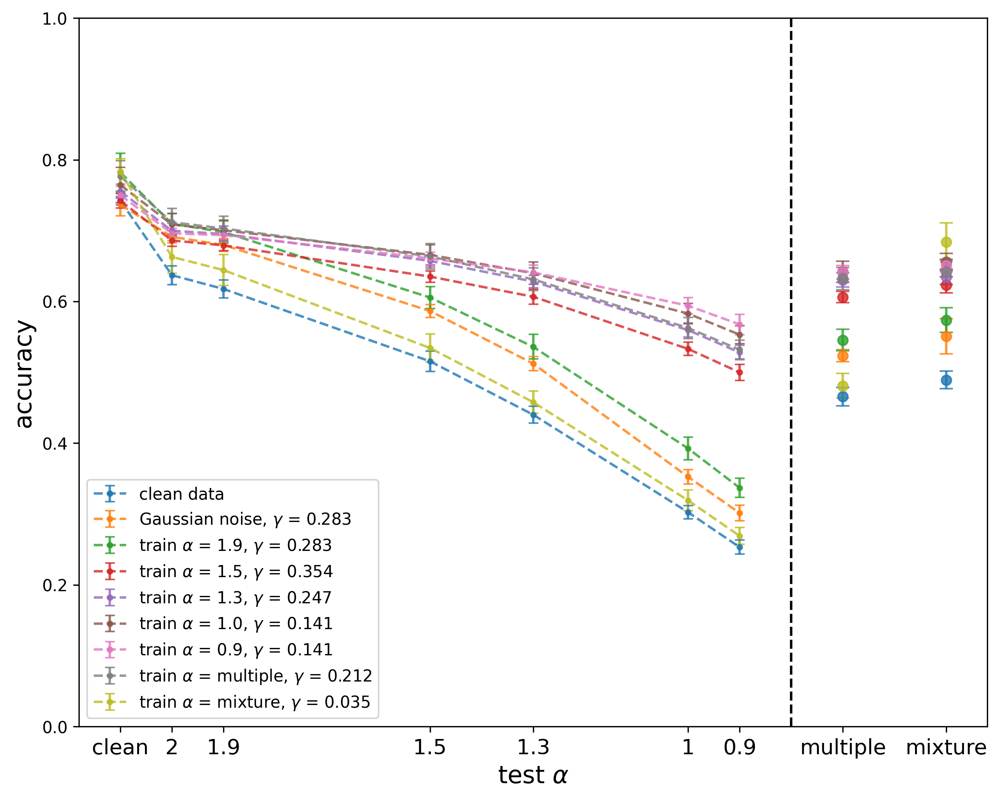

In [31]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
sigmatests = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
colors = sns.color_palette(n_colors = len(alphatrains))
fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
for i, alphatrain in enumerate(alphatrains):
    sigmatrain = dict_opt_sigma[alphatrain]
    color=colors[i]
    tmp = df[(df['alphatrain']==alphatrain)].groupby('alphatest')[['mean','std']].mean().reset_index()
    alpha_to_mean = dict(zip(tmp['alphatest'], tmp['mean']))
    alpha_to_std = dict(zip(tmp['alphatest'], tmp['std']))
    singlealphatests = [0, 2, 1.9, 1.5, 1.3, 1, 0.9]
    means = [alpha_to_mean[a] for a in singlealphatests]
    stds = [alpha_to_std[a] for a in singlealphatests]
    if alphatrain == 0:
        labels = 'clean data'
    elif alphatrain == 2:
        labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
    else:
        labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
    ax.errorbar([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
    combinealphatests = ['multiple', 'mixture']
    means = [alpha_to_mean[a] for a in combinealphatests]
    stds = [alpha_to_std[a] for a in combinealphatests]
    ax.errorbar([0.7, 0.5], means, yerr=stds, fmt='o',capsize=4,alpha=0.8, color = color)
ax.invert_xaxis()
plt.axvline(0.8,linestyle='--',color='black')
plt.legend()
plt.xlabel("test $\\alpha$",fontsize=15)#横坐标名字
plt.ylabel("accuracy",fontsize=15)#纵坐标名字
plt.ylim(0,1)
plt.xticks([2.1, 2, 1.9, 1.5, 1.3, 1, 0.9]+[0.7, 0.5], ['clean', 2, 1.9, 1.5, 1.3, 1, 0.9]+combinealphatests, fontsize=13)
plt.show()

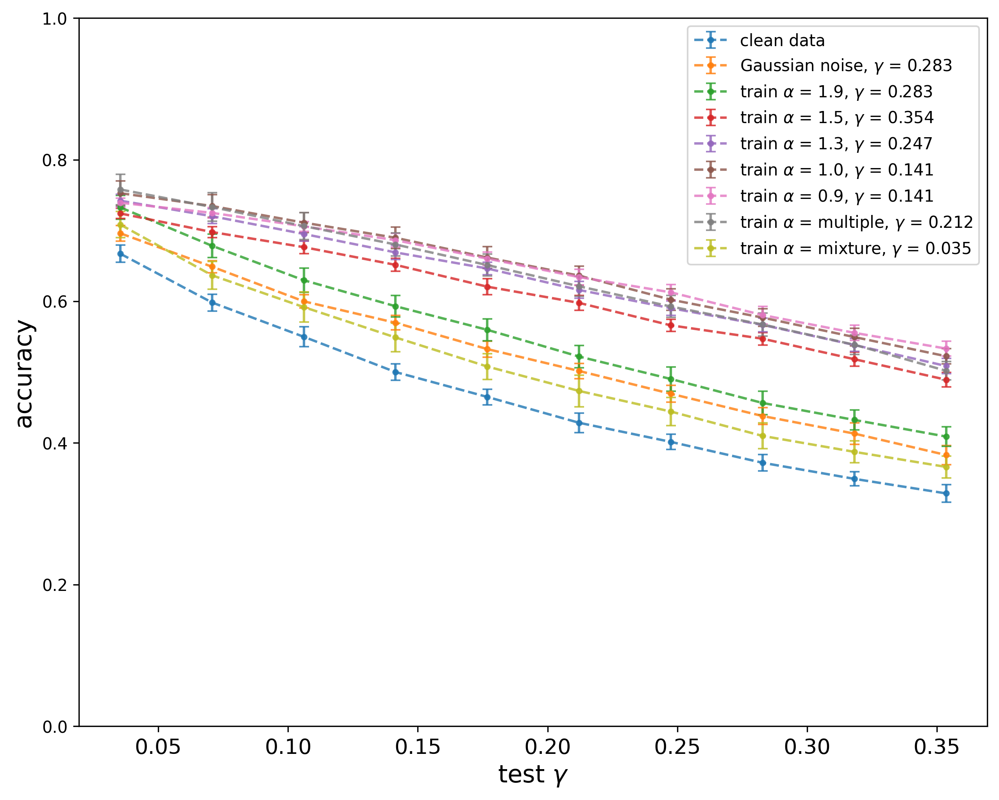

In [32]:
from matplotlib import pyplot
import seaborn as sns
alphatrains = [0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
alphatests = [0.0,2.0,1.9,1.5,1.3,1.0,0.9,'multiple','mixture']
sigmatests = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]
colors = sns.color_palette(n_colors = len(alphatrains))
fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
for i, alphatrain in enumerate(alphatrains):
    sigmatrain = dict_opt_sigma[alphatrain]
    color=colors[i]
    tmp = df[(df['alphatrain']==alphatrain)].groupby('sigmatest')[['mean','std']].mean().reset_index()
    sigma_to_mean = dict(zip(tmp['sigmatest'], tmp['mean']))
    sigma_to_std = dict(zip(tmp['sigmatest'], tmp['std']))
    means = [sigma_to_mean[a] for a in sigmatests]
    stds = [sigma_to_std[a] for a in sigmatests]
    if alphatrain == 0:
        labels = 'clean data'
    elif alphatrain == 2:
        labels = 'Gaussian noise, $\gamma$ = {:.3f}'.format(sigmatrain*np.sqrt(0.5))
    else:
        labels = 'train $\\alpha$ = {}, $\gamma$ = {:.3f}'.format(alphatrain, sigmatrain*np.sqrt(0.5))
    ax.errorbar([np.sqrt(0.5)*s for s in sigmatests],means,yerr=stds,capsize=3,fmt='--.',alpha=0.8,color = color,label =labels)
plt.legend()
plt.xlabel("test $\gamma$",fontsize=15)#横坐标名字
plt.ylabel("accuracy",fontsize=15)#纵坐标名字
plt.ylim(0,1)
plt.xticks(fontsize=13)
plt.show()

In [43]:
df.groupby(['alphatrain', 'sigmatrain'])['mean'].mean()

alphatrain  sigmatrain
0.0         0.05          0.437459
0.9         0.20          0.613804
1.0         0.20          0.620407
1.3         0.35          0.599187
1.5         0.50          0.582965
1.9         0.40          0.533840
2.0         0.40          0.515290
mixture     0.05          0.487477
multiple    0.30          0.598603
Name: mean, dtype: float64